# <span style="color:orange">Image-Based SPC Control Charts for Robotic LFAM Extrusion</span>
## Quality Data Analysis - Project Work

### Course Details:
- Politecnico di Milano — Academic Year: 2025-2026

### Project Details:
- Title: Image-based Control Charts for Defect Detection in Robotic LFAM Extrusion (Phase 1 & Phase 2)

### Author:
- Giuseppe Salerno

*Note: this project was originally developed as part of a 4-person team project for the Quality Data Analysis course. By team agreement, each member independently maintains and presents the shared codebase as part of their own portfolio.*

### Instructor:
- Bianca Maria Colosimo, Marco Luigi Giuseppe Grasso, Matteo Bugatti


# PHASE 1 ------------------------------

In [1]:
# Import libraries for image analysis
import numpy as np
import matplotlib.pyplot as plt
import cv2
import skimage
from PIL import Image

from scipy import stats
import pandas as pd
import qdatoolkit as qda
import glob
import skimage.measure
import skimage.feature
import skimage.filters
import skimage.morphology
import os
import re
import pickle
import warnings
from scipy.ndimage import gaussian_filter1d
from scipy import stats as scipy_stats
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

/opt/anaconda3/envs/QDA/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# Introduction


The development of in-space manufacturing systems, and in particular Large Format Additive Manufacturing (LFAM) based on robotic polymer composite extrusion, represents one of the most challenging frontiers of the new space economy. In this context, the absence of human operators, the scarcity of computational and energy resources, and the impossibility of tolerating material waste make automated, fully data-driven quality monitoring a strict  operational requirement rather than a mere engineering convenience. This project is framed  within the AIMiS-LFAM initiative and the primary objective of this work is to design and implement a statistical monitoring 
framework capable of detecting anomalies in the sequential image stream acquired during the additive manufacturing process. A camera with a fixed field of view captures the lateral 
surface of the printed part, covering nine consecutive deposited layers per image. Phase I 
of the project focuses on characterizing the In-Control (IC) process state from a set of 
132 sequentially acquired reference images, and on designing control charts whose parameters are estimated from this IC dataset. Phase II, described in the subsequent section, applies the finalized monitoring system to a new image stream containing both IC and anomalous observations.

The adopted methodology follows a data-driven approach, comparing a sophisticated multivariate strategy with a simpler univariate benchmark.  Moreover, it aims to address originality and creativity requests present in the project's instructions. After an initial exploration and pre-processing of the dataset, the core analysis relied on Principal Component Analysis (PCA) to manage the high dimensionality of the dataset. Specifically, a feature matrix was constructed by extracting information from different image layers and partitioning each layer into 18 patches **CHANGED IN PHASE 2 IN 3 PATCHES**. This structural decomposition allowed the PCA to capture both global and local correlation patterns while reducing noise through a smaller set of latent components.

Process monitoring was then executed through two fundamental PCA-based statistics: Hotelling’s T2 and the Squared Prediction Error (SPE). While  monitors significant shifts within the principal component subspace (detecting systematic variations), the SPE measures the residuals, the portion of the data not captured by the model. To rigorously test the efficiency of these methods before the actual Phase II analysis, a preliminary validation step was conducted. This involved creating a "synthetic" Phase II dataset by manually altering (scribbling) a subset of Phase I images to simulate known defects. While both metrics were analyzed, the final classification for anomaly detection was based on the SPE, as it proved significantly more effective at identifying these structural deviations and localized anomalies.

To evaluate the added value of this multivariate approach, a traditional I-MR control chart based on the average pixel intensity of each image was implemented as a benchmark following Professor Colosimo's lecture. This univariate method, while highly interpretable and computationally efficient, inherently ignores spatial relationships and complex textures. Comparing the two strategies allowed for a critical assessment of the trade-off between model simplicity and detection power.


The study is grounded in the established literature of Statistical Process Monitoring (SPM),as for example Megahed et al.(2011). The state-of-the-art in this field highlights the transition from classical Shewhart-type charts to Multivariate Statistical Process Monitoring (MSPM). The PCA-based 
monitoring paradigm used in this project builds on this foundation,and is further informed by the work of Menafoglio et al. (2018), which proposes monitoring image data through probability density functions mapped into a lower-dimensional functional space via simplicial PCA ,an approach that motivates the use of structured dimensionality reduction as a principled strategy for complex image-based quality monitoring.The patch-based segmentation strategy adopted here is specifically designed to balance global process context with the local spatial sensitivity required to detect the defect modes expected in this LFAM application: interlayer bonding failures, localized lack of material, layer distortions, and anomalous pixel intensity patterns.

# Assumptions and preliminary data analysis

The development of the monitoring framework was preceded by a comprehensive Preliminary Data Analysis (PDA) and a validation of the statistical assumptions required for Control Charting.

>Preliminary Data Visualization

The initial phase involved four key visualizations to characterize the Phase I (In-Control) dataset:
- Average Image & Standard Deviation Map: These revealed a periodic horizontal structure and highlighted that variability is not spatially uniform, with peaks  along the edges of the bands. This justified the use of a patch-based feature extraction to capture local structural shifts.
- Pixel Intensity Distribution: The multimodal histogram confirmed the structural complexity of the images but showed high consistency across different samples, validating the stability of Phase I.
- Run Chart of Image Means: This demonstrated that while the global average is stationary (no drifts), it possesses high short-term variance, suggesting that a univariate approach might be too "noisy" to detect subtle defects.


> UPLOAD OF DATA (IMAGES)

To ensure the images are loaded in the correct numerical order (e.g., making sure image 2 comes before image 10), we use a custom function that extracts the actual number from the file name. This prevents the default alphabetical sorting and keeps our time-series data perfectly chronological.

In [2]:
paths = glob.glob('../Phase1 dataset/*.png')

def extract_number(path):
    
    # cut the text in "_" , e.g., "15.png"
    last_part = path.split('_')[-1] 
    
    # cut ".png" in ".", in this way we obtain just the number, e.g.,"15"
    number = last_part.split('.')[0]
    
    # transform in an inter
    return int(number)

# order the list
paths.sort(key=extract_number)


# upload the images giving the ordered list
image_collection = skimage.io.ImageCollection(paths, as_gray=True)

# create the array Numpy
dataset_images = image_collection.concatenate()
dataset_images = dataset_images / 255
print("Dataset dimension:", dataset_images.shape)


Dataset dimension: (132, 115, 180)


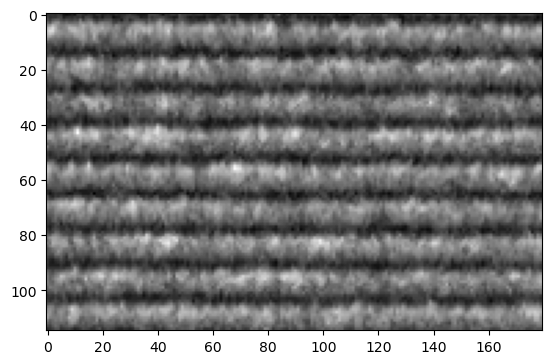

In [3]:
#plot of one image to be sure and for checking. 
plt.imshow(dataset_images[0], cmap='gray') #cmap='gray'--> visualize the data using the gray color
plt.show()

> preliminary analysis and data visualization

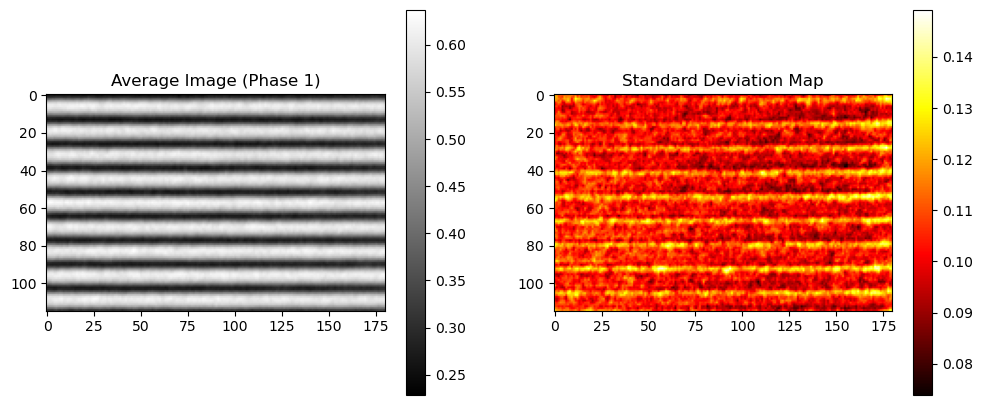

In [4]:
# compute mean and standard deviation along image axis
mean_img = np.mean(dataset_images, axis=0)
std_img = np.std(dataset_images, axis=0)

fig, ax = plt.subplots(1, 2, figsize=(12, 5))

im1 = ax[0].imshow(mean_img, cmap='gray')
ax[0].set_title('Average Image (Phase 1)')
plt.colorbar(im1, ax=ax[0])

im2 = ax[1].imshow(std_img, cmap='hot') 
ax[1].set_title('Standard Deviation Map')
plt.colorbar(im2, ax=ax[1])

plt.show()
#the average image rapresents the ideal target 
#the standard deviation map shows unstable zone. if in this map a zone is ligher it means that it changes frequently between images

The visual inspection of the Phase I mean image revealed a periodic horizontal pattern (possible to see it also through the images). The corresponding standard deviation map highlighted that the process variability is not spatially uniform, with higher dispersion (with standard deviation values around 0.14–0.15 on the normalized scale,) located along the edges of the structural bands. This spatial heterogeneity confirms the necessity of a localized feature extraction approach (patch-based) and a subsequent standardization of the variables before applying PCA (divided per 255 in order to obtain values in (0,1) range).

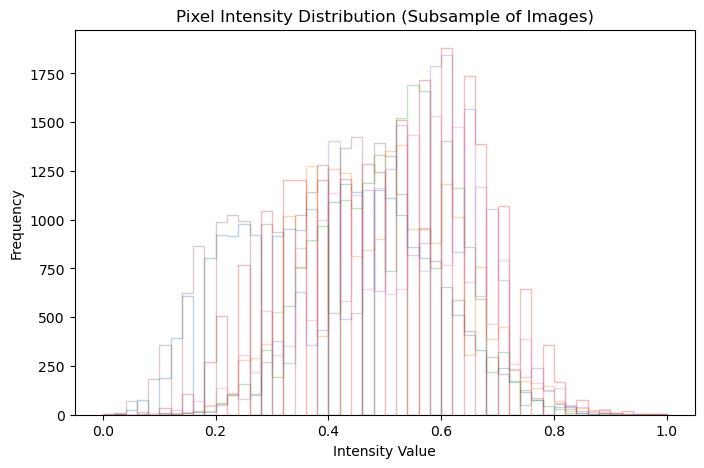

In [5]:
#needed to understand if the images have some illumination problems
plt.figure(figsize=(8, 5))
for i in range(0, 132, 20): # plot an image every 20
    plt.hist(dataset_images[i].ravel(), bins=50, alpha=0.3, histtype='step')

plt.title("Pixel Intensity Distribution (Subsample of Images)")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")
plt.show()

The Pixel Intensity Distribution analysis shows a consistent multimodal pattern across the Phase I subsamples. The overlap of the histograms for different observations confirms the global stability of the process during the training phase. The absence of pixel saturation and the consistency of the intensity peaks suggest that the monitored system maintains a stable luminance profile.

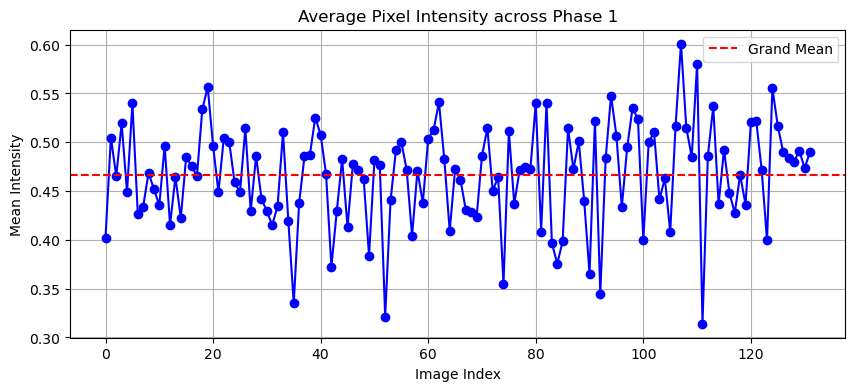

In [6]:
#plot of the images average along time
pixel_means = np.mean(dataset_images, axis=(1, 2)) # average of each image

plt.figure(figsize=(10, 4))
plt.plot(pixel_means, marker='o', linestyle='-', color='b')
plt.axhline(y=np.mean(pixel_means), color='r', linestyle='--', label='Grand Mean')
plt.title("Average Pixel Intensity across Phase 1")
plt.xlabel("Image Index")
plt.ylabel("Mean Intensity")
plt.legend()
plt.grid(True)
plt.show()

The Run Chart of the average pixel intensity confirms that the process is stationary, as no significant trends or drifts were observed over the 132 observations of Phase I. However, the high short-term variability of the global mean suggests that a univariate monitoring approach might lack the sensitivity required to detect localized defects. This further justifies the implementation of a multivariate PCA-based strategy, which focuses on the structural integrity of the image (via SPE) rather than just its global luminance.

# Statistical Assumptions: Normality and Independence
Statistical Process Monitoring traditionally relies on the assumptions of normality and independence of observations. We tested these assumptions at different levels of the pipeline:
1.	Raw Pixel Level: A normality test was initially attempted on the flattened pixel matrix (132 images  20,700 pixels). As expected, the results were uninformative (p-values approaching infinitesimal), given that pixel intensities in structured images inherently follow non-normal, multimodal distributions. Furthermore, spatial independence is naturally violated in images due to the strong correlation between neighboring pixels.
2.	Univariate Level (Image Means): Before finalizing the Image Mean as the primary benchmark for univariate monitoring, an extensive screening of several potential metrics was conducted. We evaluated Standard Deviation, Density, Foreground Ratio, Entropy, and a specialized Dark_blob_score (designed to capture localized dark anomalies).

Rejected Metrics: Upon testing, Standard Deviation, Density, Foreground Ratio, and Entropy were discarded. These metrics failed to meet the fundamental requirements for traditional Shewhart-type control charts. Specifically, they exhibited significant non-normality (often showing skewed or multimodal distributions) and failed the independence test due to high temporal autocorrelation. Monitoring these variables would have led to an unreliable Control Chart with an inflated False Alarm Rate.

Selected Metrics:  The Image Mean was retained as it demonstrated a near-perfect normal distribution. This is theoretically supported by the Central Limit Theorem, given that each point is the average of over 20,000 pixels. Both the Shapiro-Wilk test and the Run Test confirmed that the mean is normally distributed and independent.

The Dark_blob_score was also selected. Despite being a more specific metric aimed at localized defects, it satisfied the assumptions of normality and independence in Phase I. Its inclusion in the final code provides a targeted tool for detecting dark structural anomalies that might not shift the global mean significantly.

The verification of these assumptions (normality and independence) justifies the subsequent use of the I-MR Control Chart for these specific variables.

3.	Multivariate Level (PCA Scores & Statistics): For the second methodology, we focused on the PCA scores, T^2, and SPE statistics. To improve PCA efficiency, the input feature matrix was standardized to ensure all patches contributed equally to the model regardless of their original intensity scales. Since the resulting  and distributions deviated from theoretical normality, empirical control limits (based on Phase I quantiles) were implemented without relying on parametric assumptions.

The check of assumption for the second method will be presented in details together with the methodoloy instead the one for the first method is presented below:


*Spatial Alignment and Feature Ordering Assumptions*

Another critical assumption for the success of the multivariate monitoring framework is the spatial consistency of the extracted features. To ensure that the PCA model correctly learns the structural correlations of the process, a rigorous ordering convention was established for the feature matrix construction:

- Layers were extracted following a vertical sequence starting from the bottom of the image.
- Patches were indexed horizontally from left to right.

This systematic mapping, which is explicitly illustrated in the grid visualization within the Methodology section, ensures that each variable (column) in our dataset represents the same physical region across all 132 observations of Phase I and subsequently in Phase II. Maintaining this fixed spatial-to-feature alignment is vital to prevent "spatial noise" caused by misalignment and to ensure that the temporal evolution of each specific sector can be monitored accurately without losing the structural context of the image.

>CREATION OF THE DATASET 

In [7]:
#create a dataframe with 132 row and 20700 column, that is 115row*180 column, so in each column we have one pixel

n_images = dataset_images.shape[0]

df_pixels = pd.DataFrame(
    dataset_images.reshape(n_images, -1)
)

print(df_pixels.shape)

(132, 20700)


>CHECK OF ASSUMPTIONS

In [8]:
data_stack=df_pixels.stack()

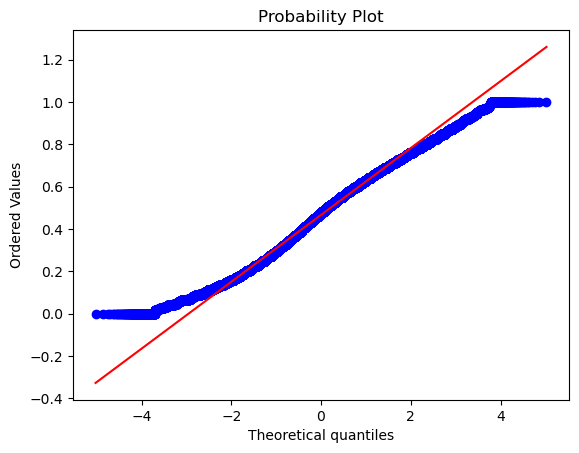

Anderson-darling test statistic = 5307.025
Anderson-darling test p-value = inf


/opt/anaconda3/envs/QDA/lib/python3.9/site-packages/qdatoolkit/models.py:684: RuntimeWarning: overflow encountered in exp
  p_value = np.exp(1.2937 - 5.709 * stat + 0.0186 * (stat ** 2))


In [9]:
_ = qda.Assumptions(data_stack).normality()

as there is a big amount of data the normality test doesn't work so well. Moreover, as we don't know the time order in which each pixel as been aquired (they are all part of the same image) we cannot verify the independence, which in reality could be problematic as assumption as the pixels have a spatial structure: close pixels in the space may be autocorrelated. however, we have decided to try to apply the clasica Xbar R control chart to show that this doesn't work with our data. 

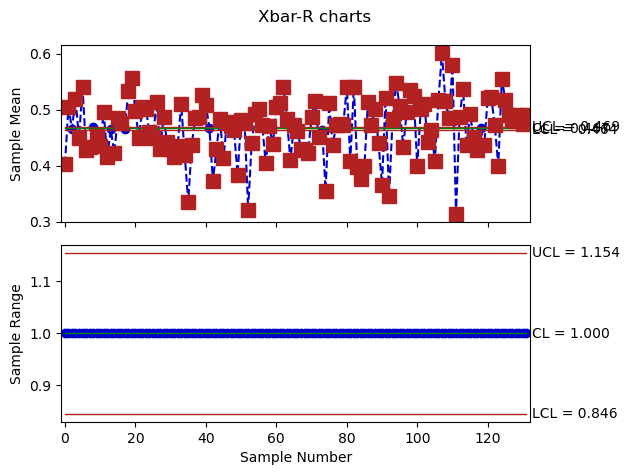

In [10]:
XbarR=qda.ControlCharts.XbarR(df_pixels)

As it is possible to see these control charts are not good--> the distance between the limits is too small and it causes a very big amount of OOC in the sample mean control chart (overvariability), instead in the sample range control chart the distance is too big (undervariability)--> hugging or stratification phenomenon.

In [11]:
# we have decided to consider a new variable (=Y), called data_Xbar, that is the mean of each sample, the average of the pixels in each image
data_Xbar=pd.DataFrame(XbarR['sample_mean'])

#we can also compute the standard deviation of this new variable, calculated correcting the sample standard deviation with C4(m)
Sy = data_Xbar['sample_mean'].std(ddof=1)     #sample standard deviation 
n=len(data_Xbar)
C4= qda.constants.getc4(n)
sigma=Sy/C4

IMPORTANT: important information may be lost (masked) by studying the sample statistics only

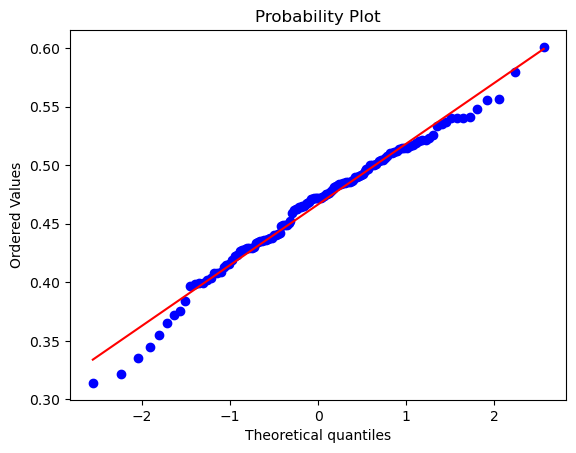

Anderson-darling test statistic = 0.633
Anderson-darling test p-value = 0.099


In [12]:
#check of normality of the new variable
_ = qda.Assumptions(data_Xbar['sample_mean']).normality()

as the pvalue is higher than 0.05 it is normal

Runs test statistic = 0.349
Runs test p-value = 0.727



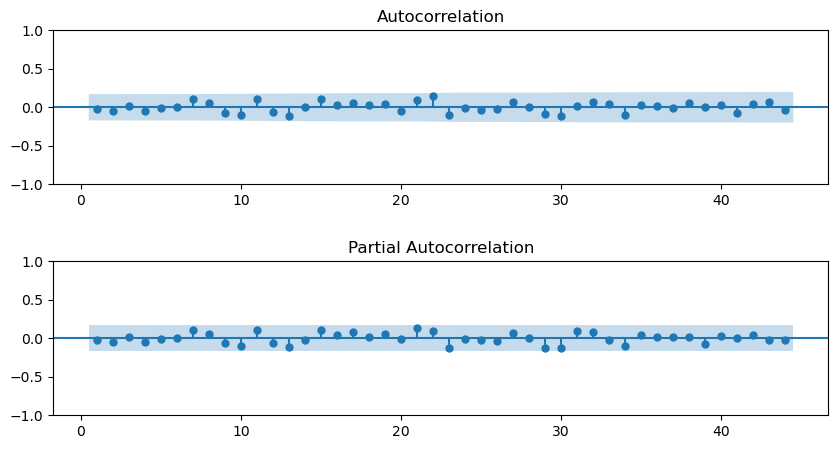

In [13]:
#check of the independence of the new vriable
_ = qda.Assumptions(data_Xbar['sample_mean']).independence()

Since the sequence of image mean intensities does not show relevant autocorrelation and is approximately normal, an I-MR chart was applied to monitor the process mean.

> dark_blob_score feature

it is a score used to reveal the localized darker defect. an high score means that the images contains a locally darker zone

In [14]:
from scipy.ndimage import uniform_filter
def dark_blob_score(images, window=17):
    scores = []

    for img in images:
        img = img.astype(float)

        # local mean on the window
        local_mean = uniform_filter(img, size=window, mode="reflect")

        # remove edges that can distort the local minimum
        pad = window // 2
        local_core = local_mean[pad:-pad, pad:-pad]

        # score: difference between the global mean and local darker zone
        score = img.mean() - local_core.min()

        scores.append(score)

    return pd.Series(scores)

In [15]:
score_1 = dark_blob_score(dataset_images, window=17)

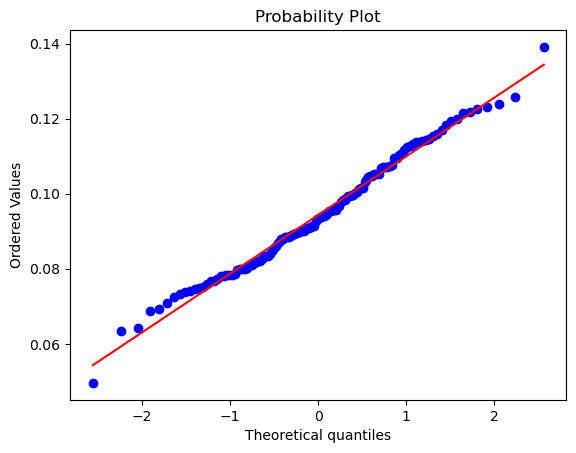

Anderson-darling test statistic = 0.476
Anderson-darling test p-value = 0.239


In [16]:
_ = qda.Assumptions(score_1).normality()

the P-value is higher than 5% so it is normal

Runs test statistic = 0.744
Runs test p-value = 0.457



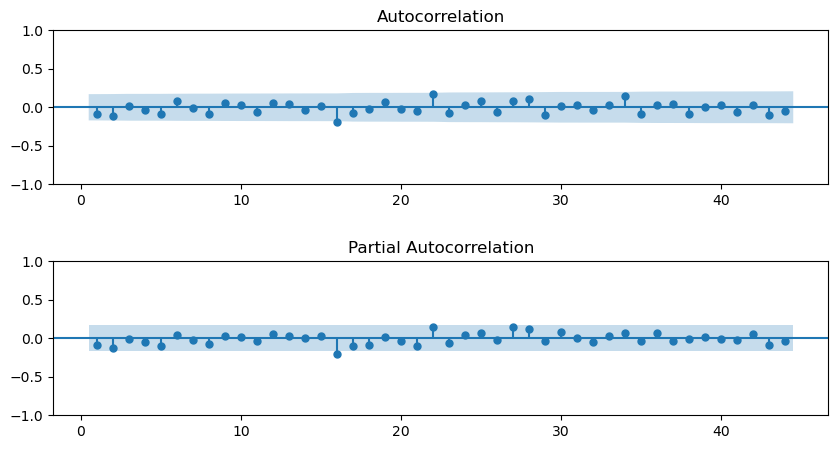

In [17]:
_ = qda.Assumptions(score_1).independence()

the pvalue is higher than 5% and also from the ACF and PACF plot this data doesn't seem autocorrelated: independence respected

As this data are normal and independent we can apply the theoretical IMR

# Proposed methodology

Before deciding on a specific method, we initiated a preliminary phase where each team member worked independently. This served a dual purpose: it ensured that everyone thoroughly understood the task ahead, and it allowed us to leverage four distinct perspectives to uncover more creative methodologies. This section discusses and analyses the different methodologies tested and motivates the final selection.

**1. The Benchmark: Univariate I-MR Chart**

The first approach considered was a traditional Individual-Moving Range (IMR) chart based on the average pixel intensity (Xbar) of each image. Two implementations were compared: one using a standard QDA toolkit and a manual calculation. For the latter, the control limits were derived using the grand mean and the standard deviation estimated as σ^=Sy/C4(m), where Sy is the sample standard deviation of the image means, that are considered as new variable called Y. C4 instead is a constant and m the number of images.

While the two implementations yielded nearly identical results, the methodology proved limited. By reducing an entire image to a single scalar (the mean), significant spatial information is lost. Critically, this method only monitors between-group variability while completely ignoring within-group variability. Consequently, a local defect that does not significantly shift the global average would remain undetected.

Parallel to the image mean, the univariate monitoring was extended to include a specialized metric: the dark_blob_score. This addition was motivated by the inherent limitation of the global average: a small, localized dark defect might only affect a tiny fraction of the 20,700 pixels. In a global mean calculation, this localized drop in intensity is "diluted" by the thousands of normal pixels, making the defect statistically invisible within the natural noise of the  chart.

The dark_blob_score was specifically engineered to isolate and amplify these signals by quantifying the density and intensity of the darkest clusters in the image. By applying the  framework to this score, we created a targeted benchmark capable of detecting structural darkening (but not brightening) that the global mean would otherwise miss. This dual-benchmark approach (Mean and Dark Blob Score) will allow us to verify if a simpler, specialized univariate tool could suffice or if the complexity of a multivariate PCA model is strictly necessary.


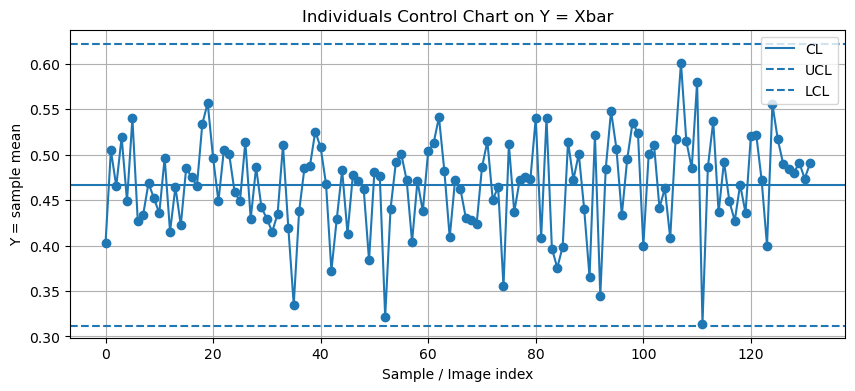

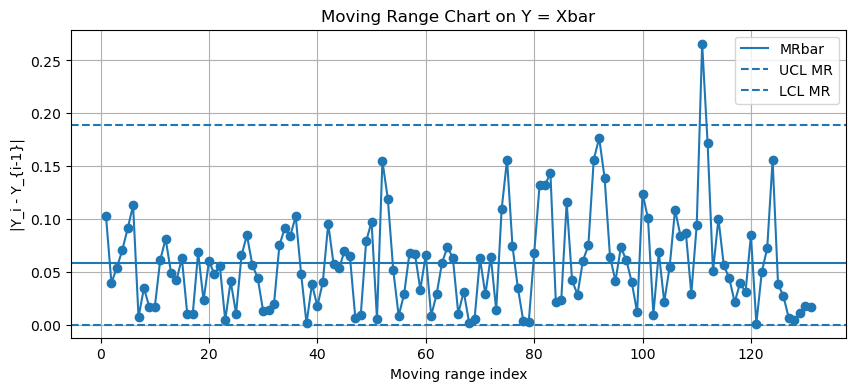

In [18]:
Y=data_Xbar['sample_mean']
Ybar=Y.mean()

UCL = Ybar + 3 * sigma
LCL= Ybar - 3 * sigma

MR = Y.diff().abs().dropna()
MRbar = MR.mean()

UCL_MR = 3.267 * MRbar
LCL_MR = 0

## 3. Plot Individuals chart

out_of_control = (Y > UCL) | (Y < LCL)

plt.figure(figsize=(10, 4))
plt.plot(Y, marker='o', linestyle='-')
plt.scatter(np.where(out_of_control)[0], Y[out_of_control], s=80, zorder=3)

plt.axhline(Ybar, linestyle='-', label='CL')
plt.axhline(UCL, linestyle='--', label='UCL')
plt.axhline(LCL, linestyle='--', label='LCL')

plt.title('Individuals Control Chart on Y = Xbar')
plt.xlabel('Sample / Image index')
plt.ylabel('Y = sample mean')
plt.legend()
plt.grid(True)
plt.show()

#MR
plt.figure(figsize=(10, 4))
plt.plot(MR, marker='o', linestyle='-')

plt.axhline(MRbar, linestyle='-', label='MRbar')
plt.axhline(UCL_MR, linestyle='--', label='UCL MR')
plt.axhline(LCL_MR, linestyle='--', label='LCL MR')

plt.title('Moving Range Chart on Y = Xbar')
plt.xlabel('Moving range index')
plt.ylabel('|Y_i - Y_{i-1}|')
plt.legend()
plt.grid(True)
plt.show()

phase1_limits = {
    "CL": Ybar,
    "UCL": UCL,
    "LCL": LCL,
    "sigma": sigma,
    "MRbar": MRbar,
    "UCL_MR": UCL_MR,
    "LCL_MR": LCL_MR
}



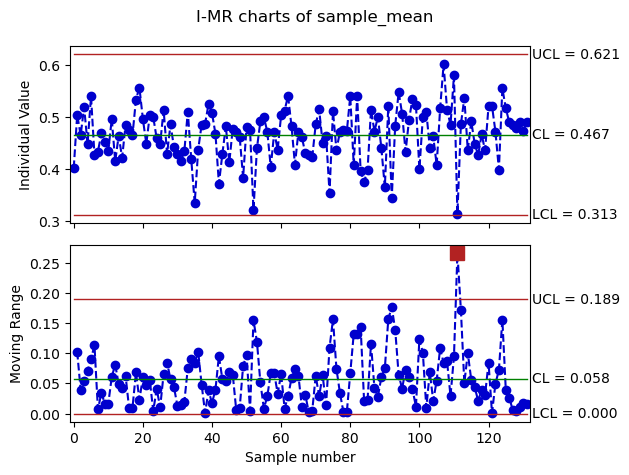

In [19]:
#try also with IMR that use a different value for the standard deviation (sigmay=MR/d2)
IMR=qda.ControlCharts.IMR(data_Xbar, 'sample_mean')

In [20]:
# INDEX OOC phase 1

# OOC ARE SAVED IN THE COLUMN I_TEST1

ooc_global_idx = np.where(IMR["I_TEST1"].notnull())[0]


print("index OOC Phase 1:")
print(ooc_global_idx.tolist())

ooc_MR_idx = np.where(IMR["MR_TEST1"].notnull())[0]


print("index OOC Phase 1:")
print(ooc_MR_idx.tolist())



index OOC Phase 1:
[]
index OOC Phase 1:
[111]


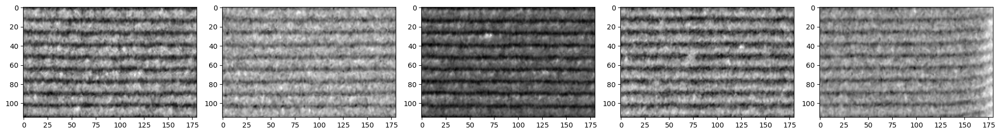

In [21]:
fig, axes = plt.subplots(1, 5, figsize=(20, 5))

images_plt = image_collection[109:114]

for i, img in enumerate(images_plt):
    
    axes[i].imshow(img, cmap='gray')

plt.tight_layout()
plt.show()

The traditional R chart was initially computed using the sample range of each image. However, the range was almost constant and equal to 255 for all images, because each image contains pixels close to both the minimum and maximum intensity values. Therefore, the range was not informative for monitoring within-image variability. 

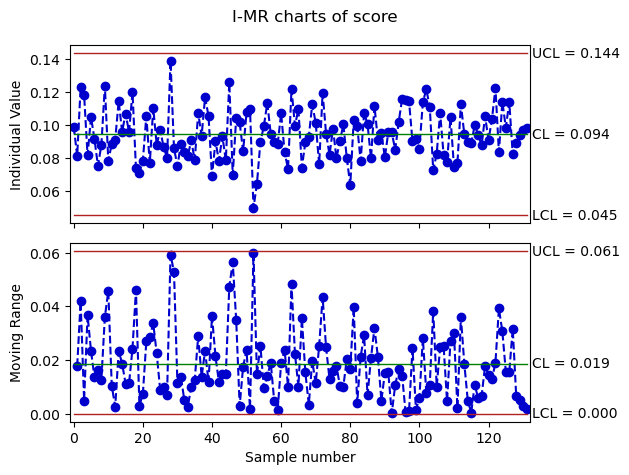

In [22]:
# create a dataframe
df_blob = score_1.to_frame(name='score')

# IMR on SCORE
IMR_blob = qda.ControlCharts.IMR(df_blob, 'score')

there is no OOC

**2. Iterative Trials and Limitations**
Before reaching the final model, several alternative strategies were evaluated:
- we experimented with segmenting each image into 9 intensity layers. For each layer, an individual IMR chart was constructed. The hypothesis was that a defect might only affect a specific brightness range. However, this approach faced two major issues. First, it significantly increased the monitoring complexity (9 separate charts). Second, like the global mean, it still lacked spatial awareness: it could tell if a layer became darker or lighter, but it remained "blind" to where the change happened or if the pixels within that layer rearranged themselves into an anomalous pattern. The gain in detection sensitivity was marginal compared to the increased in complexity.

- Reference Image Deviation: a reference image (the Phase I average) was subtracted from each new observation to obtain a residual map. Monitoring was performed on the statistics of these residuals. While conceptually simple, this method proved highly vulnerable to Common Cause Variation. Minor sensor noise, slight fluctuations in ambient lighting, and sub-pixel mechanical vibrations caused the residual maps to be "noisy".

- Feature-based Multivariate Monitoring:  Extract high-level textural and statistical features from the images, such as:
    - Entropy: To measure the complexity and "randomness" of the image texture.
    - Foreground Ratio & Density: To quantify the proportion of pixels exceeding specific intensity thresholds.
    - Standard Deviation: To monitor the internal contrast.
 
    These metrics were organized into a feature matrix for  monitoring. However, a critical statistical hurdle emerged: the assumption of multivariate normality (as mentioned above). To address this, we implement empirical control limits based on Phase I quantiles. Yet, even with this adjustment, the approach did not yield any significant improvement in detection performance. The aggregate nature of these features meant they were still not sensitive enough to capture localized defects.

- Raw Pixel PCA: Lastly, we attempted to apply PCA directly to the flattened pixel vectors, treating each image as a single 20,700-dimensional observation. This approach highlighted a significant structural characteristic of the dataset: the Scree Plotshowed a very sharp "elbow" after the first two Principal Components (PCs).
Specifically, the first two components account for approximately 30% of the cumulative variance. Beyond this point, each subsequent component adds a negligible amount of information. To reach a standard threshold of explained variance (e.g., 80%), the model would require nearly 80 components. Retaining 80 PCs for a dataset of only  images would be statistically unsound, as it offers little dimensionality reduction and carries a high risk of overfitting Phase I noise, making the model unstable for Phase II.
A notable advantage of the 2-PC approach is that the resulting scores satisfy the assumptions of normality and independence. This allows for the application of theoretical control limits based on the -distribution for the statistic, while the  still relies on empirical limits. Although this method is kept as a potential backup for Phase 2 due to its statistical elegance, it was temporarily discarded for the following reasons:
    - Low Signal-to-Noise Ratio in SPE: By explaining only 30% of the variance, 70% of the image information is relegated to the residuals. This creates a very high "noise floor" in the  chart. Since localized defects are already subtle, they tend to be "swallowed" by this large amount of unexplained structural variance, making it nearly impossible to distinguish a real anomaly from the 70% of unmodeled Phase I data.
    - Sensitivity Trade-off: With only 2 PCs, the model only captures the most dominant global patterns. It lacks the "resolution" to recognize the normal local textures; consequently, any local deviation is too small compared to the total residual error to trigger an alarm without also generating a prohibitive number of false positives.


**3. Final Proposed Strategy: Patch-based MSPM**

The final methodology adopts a Multivariate Statistical Process Monitoring approach. Rather than monitoring raw pixels, which are high-dimensional and spatially correlated, the images are transformed into a localized feature matrix. This strategy ensures a balance between global process context and the sensitivity required to detect sub-structural anomalies.

1. Intelligent Image Segmentation
The core of this approach lies in a structured decomposition of the image into 9 horizontal layers and 18 vertical patches, resulting in 162 local analysis regions **CHANGED IN 9 LAYERS, 3 PATCHES AND 27 REGIONS**.
    - Layer Detection Logic: To ensure the layers align with the physical structure of the process (the horizontal bands), the algorithm computes a Mean Image across Phase I to filter out noise and identifies the "landscape" of the process. A vertical intensity profile is extracted and refined using a Gaussian filter (σ=2) to smooth out micro-variations.
    - Adaptive Boundaries: The system searches for 8 internal boundaries by looking for local intensity minima within search windows centered around expected uniform positions. Since the transitions between bands are darker, these minima represent the natural "gutters" of the image. A small margin is excluded around each boundary to eliminate transition noise.
    - Patching: Each of the 9 layers is further subdivided into 18 vertical patches **CHANGED IN 3 PATCHES**, creating a granular grid that allows the model to "pinpoint" exactly where a correlation break occurs.

2. Feature Engineering and Semantic Meaning
For each image, a high-dimensional feature vector is constructed. These features are designed to capture different failure modes:
    - Global Layer Features: Mean and Standard Deviation monitor the overall brightness and contrast of the band. 10th and 90th percentiles are included to detect extreme pixel values (e.g., small bright spots or dark voids). A smoothed vertical profile captures the internal gradient of each layer.
    - Local Patch Features:
        - Mean and Std: Local luminance and noise.
        - Dark/Bright Mean Scores: These measure how much a patch deviates from its parent layer's average.
        - Dark/Bright Fractions: The percentage of pixels exceeding a specific -threshold, specifically designed to catch "blobs" or "scribbles."
        - Contrast Score: The ratio between patch variability and layer variability, identifying texture disruptions.

3. PCA Modeling and Parameter Tuning
A Principal Component Analysis (PCA) is applied to the standardized feature matrix. The choice of the number of retained components () was determined through a rigorous trial-and-error validation using the "scribbled" Phase I dataset.
    - Variance Threshold: We selected a target of 88% explained variance, which resulted in 83 Principal Components **CHANGED IN 70% OF EXPLAINED VARIANCE, 12 PCS**.

4. Monitoring Statistics and Assumption Validation
The monitoring phase relies on the  and  statistics. Before deployment, we verified the statistical assumptions on the 83 PCA scores **CHANGED IN 12 PCS**:
    - Independence: Confirmed.
    - Normality: The majority of the components failed the normality test, likely due to the structural complexity of the patches.

    Consequently, we implemented Empirical Control Limits (based on Phase I quantiles) to maintain a reliable False Alarm Rate. In this framework, the SPE (Squared Prediction Error) serves as the primary decision metric for Out-of-Control (OOC) detection, as it excels at capturing the breakdown of spatial correlations caused by localized defects. Hotelling’s T2 is utilized strictly as a diagnostic tool to investigate shifts within the modeled subspace.



## Parameter setting

This block defines the main settings of the monitoring procedure.

The images are divided into 9 layers and each layer in 3 patches. PCA retains enough components to explain 70% of the Phase 1 variability, and the control limits are computed with a conservative alpha value to reduce false positives.

Both global layer features and local patch-based features are used. Global features describe the general intensity behavior of each layer, while patch features help identify localized anomalies.

The final decision is based only on SPE, because SPE measures the part of the image that is not well reconstructed by the PCA model. T² is kept only for diagnostic purposes.

In [23]:
# set of parameters that we can modify to try different alternatives

PHASE1_FOLDER = r"../Phase1 dataset"
PHASE2_FOLDER = r"../Phase2 dataset"


N_LAYERS = 9

# PCA
VAR_LEVEL = 0.70

# we have decided to use an alpha of 0.0027 to reduce the amount of false positive
ALPHA = 0.0027

#these rows are needed to define which features of the image will enter in the matrix for the PCA
# global features
USE_PERCENTILES = True #activate the use of percentile: instead of just use mean and std we can also use the percentile 
USE_VERTICAL_PROFILE = True #in order to analyse how the image intensity changes along the vertical direction
SMOOTH_SIGMA = 1.5 #to reduce the local noise

# Feature locali patch-based
USE_PATCH_FEATURES = True #to activate the extraction of local features
N_PATCHES_X = 3 #we divide the image in 3 parts
PATCH_Z = 1.25

# for the final OOC analysis we use just the SPE
USE_T2_FOR_FINAL = False
USE_SPE_FOR_FINAL = True


# visualization
SHOW_ALL_OOC_IMAGES = True
SHOW_TOP_PATCHES = True
N_TOP_PATCHES_TO_SHOW = 3


#upload of images

#function that extract the number from the file. it is needed to order correctly the image
def extract_number(path):
    filename = os.path.basename(path)
    # cut the text in "_" , e.g., "15.png"
    last_part = filename.split('_')[-1]
    # cut ".png" in ".", in this way we obtain just the number, e.g.,"15"
    number = os.path.splitext(last_part)[0]
    return int(number)

#to read the image in grey scale and normalize the pixel values (0,1)
def load_gray(path):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise IOError(f"impossible to read: {path}")

    return img.astype(np.float64) / 255.0

#to upload all the image in a folder
def load_folder(folder):
    paths = glob.glob(os.path.join(folder, "*.png"))

    if not paths:
        raise ValueError(f"No PNG images found in: {folder}")

    paths = sorted(paths, key=extract_number)

    images = [load_gray(p) for p in paths]
    names = [os.path.basename(p) for p in paths]

    return np.array(images), names
#images should be (132, 115, 180)

## Layer detection and feature extraction

This section transforms each image into a set of numerical features.

First, the code detects the layer boundaries using the vertical intensity profile of the average Phase 1 image. Then, each image is divided into the detected layers.

For each layer, global intensity features are extracted, such as mean, standard deviation, percentiles and vertical profile. In addition, each layer is divided into horizontal patches to compute local features. This helps detect anomalies that affect only a small region of the image and may not be visible from global layer statistics alone.

The output of this step is the feature matrix used as input for PCA.

In [24]:
# define layer boundaries
def detect_boundaries(images, n_layers=9, smooth_sigma=2):
    mean_img = images.mean(axis=0)

    profile = mean_img.mean(axis=1) #mean for each row
    profile_smooth = gaussian_filter1d(profile, sigma=smooth_sigma) #it is used to reduce the noise --> layer boundaries will be easier to find

    H = mean_img.shape[0] 
    boundaries = []

    for j in range(1, n_layers):
        exp = int(round(H * j / n_layers)) #expectation of the layer boundaries if they are all equal
        win = max(2, int(round(H / n_layers * 0.40))) #define a research window close to the expected boundaries
#define the beginning and the end of the window
        s = max(1, exp - win)
        e = min(H - 2, exp + win)

        local_min = s + int(np.argmin(profile_smooth[s:e])) #find a local min in the window--> the boundaries correspond to the darker zone of the image
        boundaries.append(local_min)

    return sorted(boundaries), profile, profile_smooth, mean_img

#use the boundaries define with the function above and return image portion of the layers
def get_layer_slices(H, boundaries, margin=1):
    edges = [0] + list(boundaries) + [H]
    slices = []

    for i in range(len(edges) - 1):
        s = edges[i] + (margin if i > 0 else 0)
        e = edges[i + 1] - (margin if i < len(edges) - 2 else 0)

        if e <= s:
            s, e = edges[i], edges[i + 1]

        slices.append((s, e))

    return slices

#divide the image in patches along the width
def get_patch_slices(W, n_patches):
    edges = np.linspace(0, W, n_patches + 1, dtype=int)
    return [(edges[i], edges[i + 1]) for i in range(n_patches)]



# features and create the matrix that we use for the pca

def extract_layer_features_and_info(
    img,
    layer_slices,
    smooth_sigma=SMOOTH_SIGMA,
    use_percentiles=USE_PERCENTILES,
    use_vertical_profile=USE_VERTICAL_PROFILE,
    use_patch_features=USE_PATCH_FEATURES,
    n_patches_x=N_PATCHES_X
):
    parts = [] #collect the number
    info = [] #collect the name

#divide the image in patches
    H, W = img.shape
    patch_slices = get_patch_slices(W, n_patches_x)

    for layer_id, (start, end) in enumerate(layer_slices, start=1):
        layer = img[start:end, :]
        flat = layer.flatten() #transform the layer in 1d
        layer_mean = float(layer.mean())
        layer_std = float(layer.std()) + 1e-12

        # scalar features on layer and their registration
        mu = float(layer.mean())
        sigma = float(layer.std())

        parts.append(mu) #add the layer mean to the list: check if the layer is darker or not 
        info.append({
            "layer": layer_id,
            "patch": None,
            "type": "layer_mean",
            "row_start": start,
            "row_end": end,
            "col_start": 0,
            "col_end": W
        })

        parts.append(sigma) #add the standard deviation: variation of pixel in the layer: noise, texture or contrast
        info.append({
            "layer": layer_id,
            "patch": None,
            "type": "layer_std",
            "row_start": start,
            "row_end": end,
            "col_start": 0,
            "col_end": W
        })

        if use_percentiles:
            p10 = float(np.percentile(flat, 10)) #10 percentile: information about darker zone
            p90 = float(np.percentile(flat, 90)) #90 percentile: information about lighter zone in the layer

            parts.append(p10)
            info.append({
                "layer": layer_id,
                "patch": None,
                "type": "layer_p10",
                "row_start": start,
                "row_end": end,
                "col_start": 0,
                "col_end": W
            })

            parts.append(p90)
            info.append({
                "layer": layer_id,
                "patch": None,
                "type": "layer_p90",
                "row_start": start,
                "row_end": end,
                "col_start": 0,
                "col_end": W
            })

        # vertical profile of the layer, it is needed to capture the vertical variation inside the layer
        if use_vertical_profile:
            v_prof = layer.mean(axis=1) 
            v_smooth = gaussian_filter1d(v_prof, sigma=smooth_sigma) #reduce the noise

            for local_r, val in enumerate(v_smooth): 
                parts.append(float(val))
                info.append({
                    "layer": layer_id,
                    "patch": None,
                    "type": "vertical_profile",
                    "row_start": start + local_r,
                    "row_end": start + local_r + 1,
                    "col_start": 0,
                    "col_end": W
                })

        # feature on horizontal patches
        if use_patch_features:
            dark_thr = layer_mean - PATCH_Z * layer_std
            bright_thr = layer_mean + PATCH_Z * layer_std

            for patch_id, (c1, c2) in enumerate(patch_slices, start=1): #for each layer divide the image in patch and for each patch calculate different features
                patch = layer[:, c1:c2]

                patch_mean = float(patch.mean())
                patch_std = float(patch.std())

                dark_mean_score = max(layer_mean - patch_mean, 0.0) / layer_std #to measure how much the patch is darker or lighter compared to the average 
                bright_mean_score = max(patch_mean - layer_mean, 0.0) / layer_std

                dark_fraction = float(np.mean(patch <= dark_thr)) #calculate the fraction of pixel in the patch that are really dark or bright
                bright_fraction = float(np.mean(patch >= bright_thr))

                contrast_score = patch_std / layer_std #compare the patch variability with the layer variability

                patch_features = { # collect 7 features for each patch
                    "patch_mean": patch_mean,
                    "patch_std": patch_std,
                    "patch_dark_mean_score": dark_mean_score,
                    "patch_bright_mean_score": bright_mean_score,
                    "patch_dark_fraction": dark_fraction,
                    "patch_bright_fraction": bright_fraction,
                    "patch_contrast_score": contrast_score,
                }

                for ftype, val in patch_features.items():
                    parts.append(float(val))
                    info.append({
                        "layer": layer_id,
                        "patch": patch_id,
                        "type": ftype,
                        "row_start": start,
                        "row_end": end,
                        "col_start": c1,
                        "col_end": c2
                    })

    return np.array(parts, dtype=float), info
# we obtain a numeric array (part) with the features of the image. info: description of the feature

#apply the features at all the images. X= final matrix of the features
def build_feature_matrix(images, layer_slices):
    X = []
    feature_info = None

    for img in images:
        row, info = extract_layer_features_and_info(img, layer_slices)
        X.append(row)

        if feature_info is None:
            feature_info = info

    return np.array(X), feature_info


## PCA monitoring statistics

After feature extraction, the feature matrix is standardized and PCA is fitted on Phase 1 data.

The PCA model learns the normal correlation structure of the extracted features. Two statistics are then computed: Hotelling’s T² and SPE. T² measures unusual behavior within the retained PCA space, while SPE measures the reconstruction error.

SPE is used for the final decision because it detects image behavior that is not well explained by the Phase 1 PCA model. T² is kept only for diagnostic purposes.

In [25]:
# PCA + T² + SPE

#this function is needed to create the PCA model on the training dataset (phase 1)
def fit_pca(X_scaled, var_level=VAR_LEVEL): #X_scaled: standardized features matrix 
    pca_full = PCA()
    pca_full.fit(X_scaled)

    cum_var = np.cumsum(pca_full.explained_variance_ratio_) #calculate the cumulated explained variance

    K = int(np.searchsorted(cum_var, var_level)) + 1 #find the number of components that explained the amount of variance requested

    pca = PCA(n_components=K) #pca model with K components
    pca.fit(X_scaled)
    scores = pca.transform(X_scaled)

    eig = pca.explained_variance_

    X_rec = pca.inverse_transform(scores) #reconstruct original data using K components

    T2 = np.sum((scores ** 2) / eig, axis=1) #hotelling T2 statistic: how much each observations is far from the centre of the PCA space: T² = tᵀ Λ⁻¹ t (n=1)
    SPE = np.sum((X_scaled - X_rec) ** 2, axis=1) #SPE statistic, to detect defect that the PCA is not able to reconstruct (like local defect)

    residuals = X_scaled - X_rec #difference between original data and reconstructed

    print(f"PCA: K={K} components, explained variance={cum_var[K-1]*100:.1f}%")

    return pca, K, eig, cum_var, T2, SPE, scores, residuals


#this function is needed to apply the PCA model created with the function above using phase 1 dataset to the test data (phase 2 dataset)
#this is done because if we would use 'fit_pca' also with phase 2 data we would change scores, loading and also T^2 and SPE 
def apply_pca(X_scaled, pca, eig):
    scores = pca.transform(X_scaled)

    X_rec = pca.inverse_transform(scores)

    T2 = np.sum((scores ** 2) / eig, axis=1)
    SPE = np.sum((X_scaled - X_rec) ** 2, axis=1)

    residuals = X_scaled - X_rec

    return T2, SPE, scores, residuals


def ucl_empirical(stat_values, alpha=ALPHA):
    return float(np.quantile(stat_values, 1 - alpha)) #calculate the empirical limits using alpha = 0.0027


## interpretation tools

This section includes additional tools used to interpret the PCA-SPE monitoring results.

The contribution analysis is used after an SPE alarm to identify which layers, patches or features contribute most to the reconstruction error. This makes the alarm more interpretable and helps localize the possible anomaly.

In [26]:
# contribution / localization of the OOC cause: which layer and features have contributed more to the OOC. we use the residuals define in the code above
#how much each layer contribute to the OOC
def residual_contribution_by_layer(residual_row, feature_info):
    contrib = {}

    for j, r in enumerate(residual_row ** 2):
        layer = feature_info[j]["layer"]
        contrib[layer] = contrib.get(layer, 0.0) + r

    return contrib

#how much each features contribute to the OOC
def top_contribution_features(residual_row, feature_info, top_n=10):
    sq = residual_row ** 2
    idx = np.argsort(sq)[::-1][:top_n] #sort features from most anomalous to least anomalous and take just the first top n

    rows = []

    for j in idx:
        d = feature_info[j].copy() #copy the information of the most anomoulous features in idx
        d["feature_index"] = int(j)
        d["contribution"] = float(sq[j]) #add the quadratic contribution of the features: how anomalous the feature is
        d["residual"] = float(residual_row[j]) #add the residual: direction
        rows.append(d)

    return pd.DataFrame(rows)


#return the most problematic layer
def image_ooc_layers(residual_row, feature_info, n_top_layers=2):
    contrib = residual_contribution_by_layer(residual_row, feature_info) #calculate the layer contribution using the function above

    sorted_layers = sorted(contrib.items(), key=lambda x: x[1], reverse=True) #sort the layer based on the contirbution

    return [x[0] for x in sorted_layers[:n_top_layers]] #return the top n layer


## Visualization functions

This section contains the plotting functions used to visualize the results: layer boundaries, PCA charts, score plots, and detected out-of-control images.

These functions do not change the monitoring decision. They are used only to make the results easier to read and interpret.

In [27]:
# graphs

#shows the vertical profile, layer boundaries and intra-layer patch division
def plot_boundaries(profile, profile_smooth, boundaries, mean_img,
                    layer_slices=None, n_patches_x=N_PATCHES_X,
                    show_patch_grid=True):
    fig, axes = plt.subplots(1, 2, figsize=(16, 4))

    ax = axes[0]
    ax.plot(profile, alpha=0.4, label="rough profile")
    ax.plot(profile_smooth, linewidth=2, label="smooth profile")

    for b in boundaries:
        ax.axvline(b, color="red", linestyle="--", linewidth=1)

    ax.set_xlabel("row")
    ax.set_ylabel("mean intensity")
    ax.set_title("mean vertical profile + layer boundaries")
    ax.legend()
    ax.grid(True, alpha=0.3)

    ax = axes[1]
    ax.imshow(mean_img, cmap="gray", aspect="auto")

    H, W = mean_img.shape

    # layer boundaries: horizontal red lines
    for b in boundaries:
        ax.axhline(b, color="red", linestyle="--", linewidth=1.2)

    # if layer_slices is not passed, reconstruct it only for visualization
    if layer_slices is None:
        layer_slices = get_layer_slices(H, boundaries, margin=1)

    # intra-layer division: vertical cyan lines inside every layer
    if show_patch_grid:
        patch_slices = get_patch_slices(W, n_patches_x)
        patch_edges = sorted(set([x for p in patch_slices for x in p]))

        for layer_id, (s, e) in enumerate(layer_slices, start=1):
            # external layer borders
            ax.hlines([s, e], xmin=0, xmax=W-1, colors="red", linestyles="--", linewidth=0.9)

            # vertical patch boundaries only inside this layer
            for x in patch_edges:
                ax.vlines(x, ymin=s, ymax=e, colors="cyan", linestyles="-", linewidth=0.8, alpha=0.9)

            # layer label
            ax.text(
                3, (s + e) / 2,
                f"L{layer_id}",
                color="yellow",
                fontsize=8,
                va="center",
                ha="left",
                bbox=dict(facecolor="black", alpha=0.45, edgecolor="none", pad=1)
            )

        # patch labels on top
        for patch_id, (cs, ce) in enumerate(patch_slices, start=1):
            ax.text(
                (cs + ce) / 2, 3,
                f"P{patch_id}",
                color="cyan",
                fontsize=7,
                va="top",
                ha="center",
                bbox=dict(facecolor="black", alpha=0.35, edgecolor="none", pad=1)
            )

    ax.set_title("Phase 1 mean image + full layer/patch division")
    ax.axis("off")

    plt.tight_layout()
    plt.show()

#show the cumulated variance of the principal component from PCA
def plot_scree(cum_var, K, var_level):
    plt.figure(figsize=(7, 4))
    plt.plot(np.arange(1, len(cum_var) + 1), cum_var * 100, "o-", markersize=5)
    plt.axhline(var_level * 100, color="red", linestyle="--", label=f"threshold {var_level*100:.0f}%")
    plt.axvline(K, color="green", linestyle="--", label=f"K={K}")
    plt.xlabel('number of components')
    plt.ylabel("cumulated variance %")
    plt.title("Scree plot — Phase 1")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

#create a generic control chart for a statistic, plot in red the OOC (alarms)
def plot_control_chart(idx, values, UCL, LCL=None, label="statistic",
                       title="Control Chart", color="steelblue", phase="", alarm_mask=None):
    if alarm_mask is None:
        alarms = values > UCL

        if LCL is not None:
            alarms = alarms | (values < LCL)
    else:
        alarms = alarm_mask

    plt.figure(figsize=(13, 4))
    plt.plot(idx, values, "o-", color=color, markersize=4, linewidth=1, label=label)

    if alarms.any():
        plt.plot(
            idx[alarms],
            values[alarms],
            "rs",
            markersize=10,
            zorder=5,
            label=f"Alarm ({alarms.sum()})"
        )

    plt.axhline(UCL, color="red", linestyle="--", linewidth=2, label=f"UCL = {UCL:.4f}")

    if LCL is not None:
        plt.axhline(LCL, color="red", linestyle="--", linewidth=2, label=f"LCL = {LCL:.4f}")

    plt.xlabel(f"Image index ({phase})")
    plt.ylabel(label)
    plt.title(title)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    return alarms


#it show the OOC images: for each OOC it show the average image of phase 1, the OOC image highiliting the suspected layer, a table with the features that
#have contributed the most (top_contribution_features), and the differences map
def plot_ooc_images(
    images_p2,
    files_p2,
    alarm_mask,
    residuals_p2,
    feature_info,
    boundaries,
    layer_slices,
    images_p1_mean,
    title_prefix="OOC"
):
    ooc_idx = np.where(alarm_mask)[0]

    if len(ooc_idx) == 0:
        print("No OOC to visualize")
        return

    for i in ooc_idx:
        img = images_p2[i]
        diff = img - images_p1_mean

        residual_row = residuals_p2[i]

        top_df = top_contribution_features(residual_row, feature_info, top_n=15)

        ooc_layers = image_ooc_layers(residual_row, feature_info, n_top_layers=2)

        fig, axes = plt.subplots(1, 3, figsize=(16, 4))

        ax = axes[0]
        ax.imshow(images_p1_mean, cmap="gray", vmin=0, vmax=1, aspect="auto")
        for b in boundaries:
            ax.axhline(b, color="red", linestyle="--", linewidth=1)
        ax.set_title("Phase 1 mean")
        ax.axis("off")

        ax = axes[1]
        ax.imshow(img, cmap="gray", vmin=0, vmax=1, aspect="auto")

        for b in boundaries:
            ax.axhline(b, color="yellow", linestyle="--", linewidth=1)

        for layer_id in ooc_layers:
            s, e = layer_slices[layer_id - 1]
            ax.axhspan(s, e, color="red", alpha=0.16)

        if SHOW_TOP_PATCHES:
            patch_rows = top_df[
                top_df["type"].astype(str).str.startswith("patch")
            ].head(N_TOP_PATCHES_TO_SHOW)

            for _, r in patch_rows.iterrows():
                c1 = int(r["col_start"])
                c2 = int(r["col_end"])
                r1 = int(r["row_start"])
                r2 = int(r["row_end"])

                rect = plt.Rectangle(
                    (c1, r1),
                    c2 - c1,
                    r2 - r1,
                    linewidth=2,
                    edgecolor="lime",
                    facecolor="none"
                )
                ax.add_patch(rect)

        ax.set_title(f"{title_prefix} img {i+1}: {files_p2[i]}\nLayers: {ooc_layers}")
        ax.axis("off")

        ax = axes[2]
        vmax = max(abs(diff.min()), abs(diff.max()), 0.01)
        im = ax.imshow(diff, cmap="RdBu_r", vmin=-vmax, vmax=vmax, aspect="auto")

        for b in boundaries:
            ax.axhline(b, color="black", linestyle="--", linewidth=1, alpha=0.5)

        plt.colorbar(im, ax=ax, fraction=0.046)
        ax.set_title("difference: Phase 2 − Phase 1 mean")
        ax.axis("off")

        plt.suptitle(f"image {i+1} — {files_p2[i]}", fontweight="bold")
        plt.tight_layout()
        plt.show()

        print(f"\nTop contribution features — image {i+1}:")
        display(top_df[["feature_index", "layer", "patch", "type", "contribution", "residual", "row_start", "row_end", "col_start", "col_end"]])


# Assumption checking

Before using the PCA-based control chart, the assumptions behind the monitoring procedure are checked on the **Phase 1 data**, because Phase 1 is used to define the reference in-control behaviour of the process.

The checks are not performed on the individual pixels. This is important because neighbouring pixels in an image are naturally correlated: treating all pixels as independent observations would be misleading. Instead, the assumptions are checked on the quantities that are actually monitored by the control chart, the PCA scores. it is possible to see that they are all independent, but some of them are not normal, for this reason we have tried to apply the box cox transformation to the original variables that influence the non normal PCs, that hasn't worked well (further information below).

The two main assumptions considered here are:

1. **Approximate normality**: useful mainly if parametric control limits are used. In this notebook, empirical limits are used, so normality is treated as a diagnostic check rather than a strict requirement.
2. **Independence over time**: consecutive Phase 1 images should not show a systematic temporal pattern. If this assumption is violated, the estimated control limits may be less reliable because the Phase 1 sample would not behave like a sequence of independent in-control observations.

Since the variables used are independent, but some of them not normal (even after the box cox transformation), empirical control limits are preferred for the final SPE chart. This makes the method more robust when normality is not perfectly satisfied.


In [28]:
def assumption_report_qda(scores):

    rows = []
    n_pc=scores.shape[1]
    for k in range(n_pc):
        serie = pd.Series(scores[:, k], name=f"PC{k+1}")

        _, p_norm = qda.Assumptions(serie).normality(qqplot=False)

        _, p_ind = qda.Assumptions(serie).independence(plotit=False)

        rows.append({
            "variable": f"PC{k+1}",
            "normality_pvalue": p_norm,
            "normality_result": "OK" if p_norm >= 0.05 else "Rejected",
            "independence_pvalue": p_ind,
            "independence_result": "OK" if p_ind >= 0.05 else "Rejected",
        })

    df_assumptions = pd.DataFrame(rows)

    print("\nAssumption checking:")
    display(df_assumptions)

    return df_assumptions

# PERFORMANCE METRICS TO USE IN PHASE 2 

In [29]:
  # ─── PERFORMANCE METRICS ─────────────────────────────────────────────────────

def compute_metrics(y_true, y_pred, verbose=True):

    # Check dimensions
    if len(y_true) != len(y_pred):
        raise ValueError("y_true and y_pred must have the same length")

    # Convert to numpy arrays
    y_true = np.asarray(y_true).astype(int)
    y_pred = np.asarray(y_pred).astype(int)
    # ─── CONFUSION MATRIX ────────────────────────────────────────────────────

    TP = int(np.sum((y_pred == 1) & (y_true == 1)))
    TN = int(np.sum((y_pred == 0) & (y_true == 0)))
    FP = int(np.sum((y_pred == 1) & (y_true == 0)))
    FN = int(np.sum((y_pred == 0) & (y_true == 1)))

    # ─── METRICS ─────────────────────────────────────────────────────────────

    accuracy = (TP + TN) / (TP + TN + FP + FN)

    precision = TP / (TP + FP) if (TP + FP) > 0 else 0.0

    recall = TP / (TP + FN) if (TP + FN) > 0 else 0.0

    f1 = (2 * precision * recall) / (precision + recall) \
         if (precision + recall) > 0 else 0.0

    false_alarm_rate = FP / (FP + TN) \
                       if (FP + TN) > 0 else 0.0

    missed_detection_rate = FN / (FN + TP) \
                            if (FN + TP) > 0 else 0.0

    # ─── SAVE RESULTS ────────────────────────────────────────────────────────

    metrics = {
        "TP": TP,
        "TN": TN,
        "FP": FP,
        "FN": FN,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1,
        "False Alarm Rate": false_alarm_rate,
        "Missed Detection Rate": missed_detection_rate
    }

    # ─── PRINT RESULTS ──────────────────────────────────────────────────────

    if verbose:

        print("\n" + "=" * 60)
        print("PERFORMANCE METRICS")
        print("=" * 60)

        print(f"TP (True Positive)   : {TP}")
        print(f"TN (True Negative)   : {TN}")
        print(f"FP (False Positive)  : {FP}")
        print(f"FN (False Negative)  : {FN}")

        print("-" * 60)

        print(f"Accuracy             : {accuracy:.4f}")
        print(f"Precision            : {precision:.4f}")
        print(f"Recall               : {recall:.4f}")
        print(f"F1 Score             : {f1:.4f}")
        print(f"False Alarm Rate     : {false_alarm_rate:.4f}")
        print(f"Missed Detection Rate: {missed_detection_rate:.4f}")

        print("=" * 60)

    return metrics


# phase 1

*****************************************************************
PHASE 1 — upload
*****************************************************************

layer boundaries: [13, 26, 39, 51, 64, 77, 90, 102]
Layer order reversed to respect deposition sequence (bottom to top).


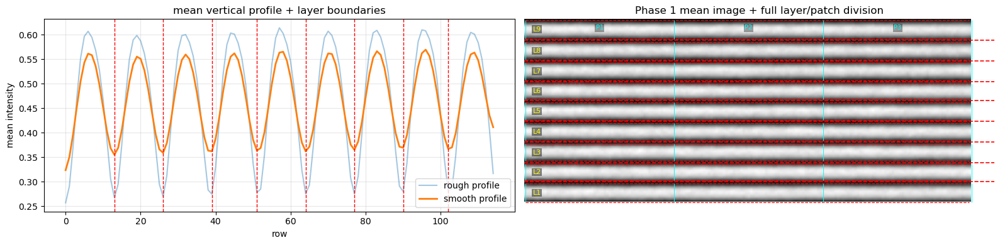


Phase 1 features extraction...
\Phase 1 layer statistics:
Layer 1: mean=0.4801±0.0580 | std=0.1416±0.0192
Layer 2: mean=0.5198±0.0559 | std=0.1262±0.0152
Layer 3: mean=0.4987±0.0593 | std=0.1338±0.0173
Layer 4: mean=0.4951±0.0584 | std=0.1349±0.0175
Layer 5: mean=0.4964±0.0579 | std=0.1384±0.0170
Layer 6: mean=0.5120±0.0582 | std=0.1244±0.0174
Layer 7: mean=0.4936±0.0519 | std=0.1317±0.0173
Layer 8: mean=0.4890±0.0547 | std=0.1330±0.0169
Layer 9: mean=0.4746±0.0502 | std=0.1466±0.0187

Phase 1 Fit PCA...
PCA: K=12 components, explained variance=70.5%


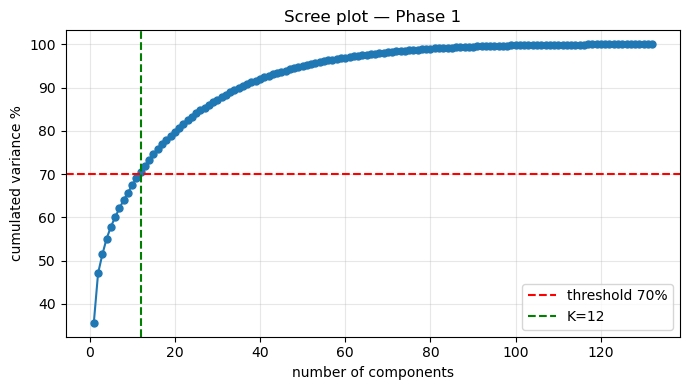

Anderson-darling test statistic = 0.789
Anderson-darling test p-value = 0.041
Runs test statistic = -0.266
Runs test p-value = 0.791

Anderson-darling test statistic = 1.897
Anderson-darling test p-value = 0.000
Runs test statistic = 1.591
Runs test p-value = 0.112

Anderson-darling test statistic = 0.628
Anderson-darling test p-value = 0.102
Runs test statistic = -1.046
Runs test p-value = 0.296

Anderson-darling test statistic = 0.768
Anderson-darling test p-value = 0.046
Runs test statistic = -0.864
Runs test p-value = 0.388

Anderson-darling test statistic = 0.415
Anderson-darling test p-value = 0.335
Runs test statistic = -0.576
Runs test p-value = 0.565

Anderson-darling test statistic = 1.410
Anderson-darling test p-value = 0.001
Runs test statistic = 0.186
Runs test p-value = 0.853

Anderson-darling test statistic = 1.053
Anderson-darling test p-value = 0.009
Runs test statistic = 0.218
Runs test p-value = 0.827

Anderson-darling test statistic = 0.350
Anderson-darling test p-v

,variable,normality_pvalue,normality_result,independence_pvalue,independence_result
0,PC1,0.040849,Rejected,0.790535,OK
1,PC2,0.000077,Rejected,0.111616,OK
2,PC3,0.101653,OK,0.295529,OK
3,PC4,0.045956,Rejected,0.387622,OK
4,PC5,0.335034,OK,0.564768,OK
5,PC6,0.001207,Rejected,0.852830,OK
6,PC7,0.009125,Rejected,0.827495,OK
7,PC8,0.472354,OK,0.482808,OK
8,PC9,0.030190,Rejected,0.592426,OK
9,PC10,0.886812,OK,0.879793,OK


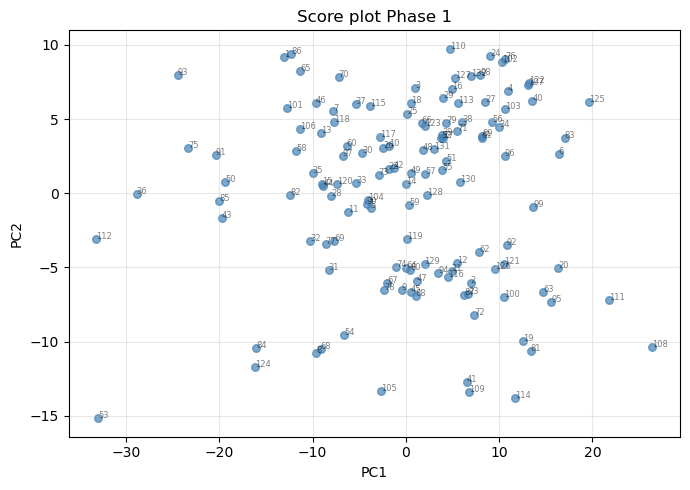


most important features for non normal PC:


,PC,feature,loading,abs_loading
0,PC1,L1_PNone_layer_mean,0.965723,0.965723
1,PC1,L8_PNone_layer_mean,0.958388,0.958388
2,PC1,L1_P2_patch_mean,0.954624,0.954624
3,PC1,L1_P1_patch_mean,0.951594,0.951594
4,PC1,L7_PNone_layer_mean,0.951446,0.951446
5,PC1,L1_PNone_vertical_profile,0.948597,0.948597
6,PC1,L9_PNone_layer_mean,0.945386,0.945386
7,PC1,L1_PNone_vertical_profile,0.944378,0.944378
8,PC1,L8_P2_patch_mean,0.943852,0.943852
9,PC1,L4_PNone_layer_mean,0.940599,0.940599


selected features for box cox:


,feature,column_index
0,L1_PNone_layer_mean,0
1,L8_PNone_layer_mean,251
2,L1_P2_patch_mean,23
3,L1_P1_patch_mean,16
4,L7_PNone_layer_mean,215
5,L1_PNone_vertical_profile,4
6,L9_PNone_layer_mean,287
7,L8_P2_patch_mean,273
8,L4_PNone_layer_mean,108
9,L3_PNone_layer_std,73


PCA: K=12 components, explained variance=70.0%


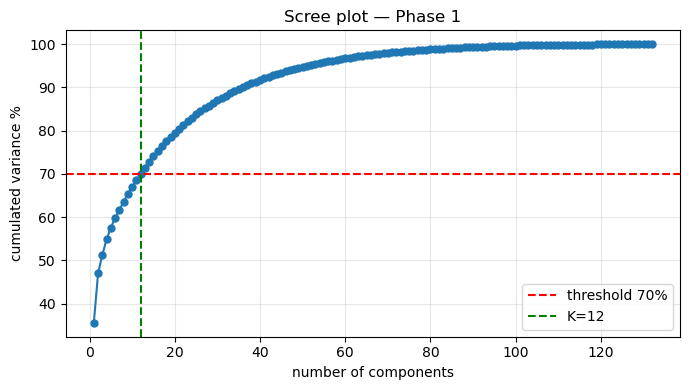

Anderson-darling test statistic = 0.720
Anderson-darling test p-value = 0.060
Runs test statistic = -0.715
Runs test p-value = 0.475

Anderson-darling test statistic = 1.741
Anderson-darling test p-value = 0.000
Runs test statistic = 1.643
Runs test p-value = 0.100

Anderson-darling test statistic = 0.442
Anderson-darling test p-value = 0.289
Runs test statistic = -0.339
Runs test p-value = 0.734

Anderson-darling test statistic = 0.569
Anderson-darling test p-value = 0.140
Runs test statistic = -1.214
Runs test p-value = 0.225

Anderson-darling test statistic = 0.393
Anderson-darling test p-value = 0.376
Runs test statistic = 0.003
Runs test p-value = 0.998

Anderson-darling test statistic = 0.238
Anderson-darling test p-value = 0.782
Runs test statistic = -0.874
Runs test p-value = 0.382

Anderson-darling test statistic = 0.313
Anderson-darling test p-value = 0.549
Runs test statistic = 0.393
Runs test p-value = 0.694

Anderson-darling test statistic = 0.190
Anderson-darling test p-v

,variable,normality_pvalue,normality_result,independence_pvalue,independence_result
0,PC1,0.060280,OK,0.474694,OK
1,PC2,0.000186,Rejected,0.100338,OK
2,PC3,0.288637,OK,0.734448,OK
3,PC4,0.140007,OK,0.224842,OK
4,PC5,0.375875,OK,0.997887,OK
5,PC6,0.782324,OK,0.382266,OK
6,PC7,0.548957,OK,0.694090,OK
7,PC8,0.899378,OK,0.923428,OK
8,PC9,0.126994,OK,0.387622,OK
9,PC10,0.179248,OK,0.592426,OK



control limits:
alpha = 0.0027
T²  UCL = 65.879470
SPE UCL final = 194.641582


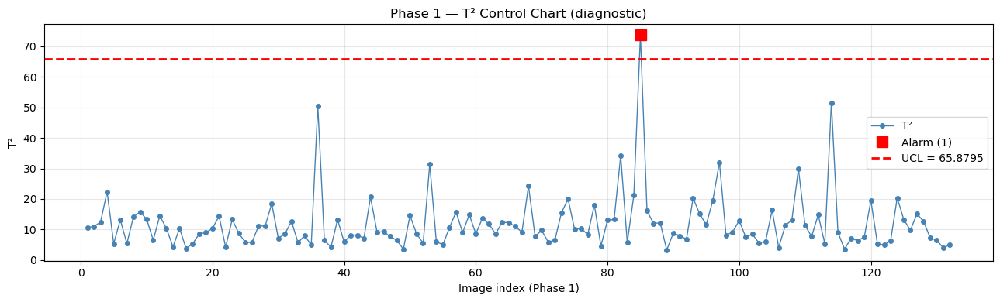

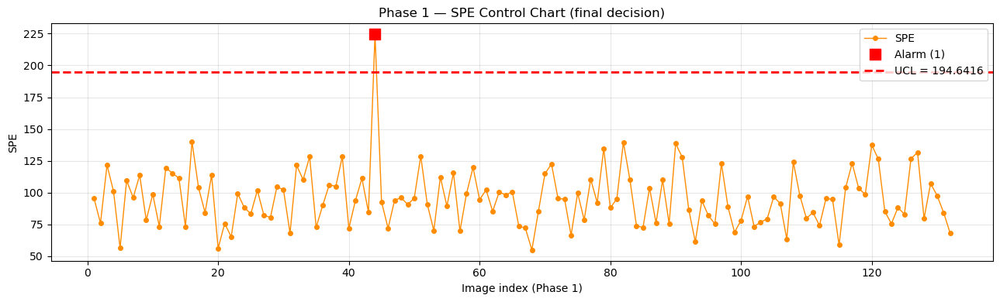


 Phase 1 alarms:
T² diagnostic : 1 / 132
SPE   : 1 / 132
SPE alarms phase 1 [44]


In [30]:
# PHASE 1: upload and fit

print("*" * 65)
print("PHASE 1 — upload")
print("*" * 65)

images_p1, files_p1 = load_folder(PHASE1_FOLDER) #upload of image using load_folder function

N, H, W = images_p1.shape #save the dimension of the images

boundaries, profile, profile_smooth, mean_img_p1 = detect_boundaries(images_p1, N_LAYERS) #identify the layer and the veritical profile

print(f"\nlayer boundaries: {boundaries}")

layer_slices = get_layer_slices(H, boundaries, margin=1)
layer_slices = layer_slices[::-1]
print("Layer order reversed to respect deposition sequence (bottom to top).")

plot_boundaries(
    profile,
    profile_smooth,
    boundaries,
    mean_img_p1,
    layer_slices=layer_slices,
    n_patches_x=N_PATCHES_X,
    show_patch_grid=True
)

#creation and extraction of the features
print("\nPhase 1 features extraction...")

X_p1, feature_info = build_feature_matrix(images_p1, layer_slices) #construction of the feature matrix

#show some statistics for the layers
print("\Phase 1 layer statistics:")

pos = 0
for i, (s, e) in enumerate(layer_slices): 
    layer_height = e - s

    mu_vals = X_p1[:, pos]
    std_vals = X_p1[:, pos + 1]
#print the mean, the variability of the mean, the standard deviation and the variability of the standard deviation for each layer
    print(
        f"Layer {i+1}: mean={mu_vals.mean():.4f}±{mu_vals.std():.4f} | "
        f"std={std_vals.mean():.4f}±{std_vals.std():.4f}"
    )
#add the other features
    n_feat_layer = 2
    if USE_PERCENTILES:
        n_feat_layer += 2
    if USE_VERTICAL_PROFILE:
        n_feat_layer += layer_height
    if USE_PATCH_FEATURES:
        n_feat_layer += N_PATCHES_X * 7

    pos += n_feat_layer

#standardization of the features: important for the PCA
scaler = StandardScaler()
X_p1_scaled = scaler.fit_transform(X_p1)

print("\nPhase 1 Fit PCA...")

pca, K, eig, cum_var, T2_p1, SPE_p1, scores_p1, residuals_p1 = fit_pca(X_p1_scaled)

#show the cumulated variance associated to the increase of the number of components
plot_scree(cum_var, K, VAR_LEVEL)
#check of assumptions on the values used for the control chart
df_assumptions = assumption_report_qda(scores_p1)

if K >= 2:
    plt.figure(figsize=(7, 5))
    plt.scatter(scores_p1[:, 0], scores_p1[:, 1], alpha=0.7, s=30, color="steelblue") #scatterplot of the first 2 components of the PCA

    for j, (x, y) in enumerate(zip(scores_p1[:, 0], scores_p1[:, 1])):
        plt.annotate(str(j + 1), (x, y), fontsize=6, alpha=0.5) #useful to see strange phase 1 images

    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.title("Score plot Phase 1")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# As it is possible to see some features are not normal, so we have decided before of applying the emprical limits tro try with the box cox transformation in order to apply the theoretical limits
# As we have the PC that are not normal we have first to identify which are the loading (relative to the features) that influence more this principal compontent (so that have an higher coefficient (in absolute value))
#once identified the top_loading_per_pc we have to apply the box cox transformation to them and retry to apply the PCA, obtaining in the end different PC on which we have to verify again the assumptions

# creation of the name using feature_info
def make_feature_names(feature_info):
    names = []

    for i, f in enumerate(feature_info):
        layer = f["layer"]
        patch = f["patch"]
        ftype = f["type"]

        name = f"L{layer}_P{patch}_{ftype}"

        names.append(name)

    return names


feature_names = make_feature_names(feature_info)


# Compute of the loading
# pca.components_ has shape: K x n_features
# so we transform it to obtain: n_features x K
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

df_loadings = pd.DataFrame(
    loadings,
    index=feature_names,
    columns=[f"PC{i+1}" for i in range(K)]
)


# extraction of the most important features (loading) for each PC
def top_loadings_per_pc(df_loadings, n_top=10):
    rows = []

    for pc in df_loadings.columns:
        tmp = df_loadings[[pc]].copy()
        tmp["abs_loading"] = tmp[pc].abs()
        tmp = tmp.sort_values("abs_loading", ascending=False).head(n_top)

        for feature, row in tmp.iterrows():
            rows.append({
                "PC": pc,
                "feature": feature,
                "loading": row[pc],
                "abs_loading": row["abs_loading"]
            })

    return pd.DataFrame(rows)


# we have decide to exclude the PC that results normal from the first assumption checking

pcs_normal = ["PC3", "PC5", "PC8", "PC10", "PC11", "PC12"]

pcs_not_normal = [
    pc for pc in df_loadings.columns
    if pc not in pcs_normal
]

df_loadings_not_normal = df_loadings[pcs_not_normal]


N_TOP_FEATURES_PER_PC = 10 #we select just the top 10 features for each pc

df_top_loadings = top_loadings_per_pc(
    df_loadings_not_normal,
    n_top=N_TOP_FEATURES_PER_PC
)

print("\nmost important features for non normal PC:")
display(df_top_loadings)



# selection of the index of the features
important_features = df_top_loadings["feature"].unique()
important_idx = [feature_names.index(f) for f in important_features]

df_important_features = pd.DataFrame({
    "feature": important_features,
    "column_index": important_idx
})

print("selected features for box cox:")
display(df_important_features)


# Box-Cox on original featuress
def fit_boxcox_selected_features(X_train, selected_idx):
    X_train_bc = X_train.copy()
    params = {}

    for idx in selected_idx:
        x = X_train[:, idx].astype(float)

        # to avoid that the box cox gives error we transform the values all in positive values
        shift = 0.0
        if np.min(x) <= 0:
            shift = abs(np.min(x)) + 1e-6

        x_pos = x + shift

        # if the feature is constant, box cox doesn't make sense
        if np.std(x_pos) < 1e-12:
            params[idx] = {
                "lambda": None,
                "shift": shift,
                "skipped": True
            }
            continue

        x_bc, lambda_bc = scipy_stats.boxcox(x_pos)

        X_train_bc[:, idx] = x_bc

        params[idx] = {
            "lambda": lambda_bc,
            "shift": shift,
            "skipped": False
        }

    return X_train_bc, params


def apply_boxcox_selected_features(X, params):
    X_bc = X.copy()

    for idx, par in params.items():
        if par["skipped"]:
            continue

        x = X[:, idx].astype(float)
        shift = par["shift"]
        lambda_bc = par["lambda"]

        x_pos = x + shift

        #just if some values remain <0
        if np.min(x_pos) <= 0:
            extra_shift = abs(np.min(x_pos)) + 1e-6
            x_pos = x_pos + extra_shift

        X_bc[:, idx] = scipy_stats.boxcox(x_pos, lmbda=lambda_bc)

    return X_bc


X_p1_boxcox, boxcox_params_features = fit_boxcox_selected_features(
    X_p1,
    important_idx
)


# new standardization after the box cox
scaler_boxcox = StandardScaler()
X_p1_boxcox_scaled = scaler_boxcox.fit_transform(X_p1_boxcox)


# new PCA after box cox
pca_boxcox, K_boxcox, eig_boxcox, cum_var_boxcox, T2_p1_boxcox, SPE_p1_boxcox, scores_p1_boxcox, residuals_p1_boxcox = fit_pca(
    X_p1_boxcox_scaled,
    var_level=VAR_LEVEL
)

plot_scree(cum_var_boxcox, K_boxcox, VAR_LEVEL)


# check of assumptions in the new PC
df_assumptions_boxcox = assumption_report_qda(
    scores_p1_boxcox
)


#we can see that after this transformation PC2 remains non normal and PC12 become non normal
#we could avoid to include the PC12, but the PC2 cannot be excluded
#so for this reason we have decided to procede with empirical limits and not theoretical
#PC2 remained non-normal because it is mainly associated with standard deviation-based features,
# whose distribution may be affected by outliers, heavy tails, boundedness or heterogeneous image behaviour. 
# These sources of non-normality cannot always be corrected by a monotonic power transformation such as Box-Cox. 
# Furthermore, after the transformation, PCA was fitted again, so the new components are not identical to the original ones. 
# The transformation changes the covariance structure of the feature matrix, and this can redistribute non-normality across components.
# For this reason, PC12, which was normal before the transformation, became slightly non-normal afterwards. Since the rejection for PC12 is close to the 0.05 threshold, 
# this result can also be interpreted as a borderline effect, possibly related to multiple normality tests being performed simultaneously.


#compute the empirical limits for the statistics T2 and SPE (as PC are not normal, however they are all independent
T2_UCL = ucl_empirical(T2_p1, ALPHA)

SPE_UCL = ucl_empirical(SPE_p1, ALPHA)

print(f"\ncontrol limits:")
print(f"alpha = {ALPHA}")
print(f"T²  UCL = {T2_UCL:.6f}")
print(f"SPE UCL final = {SPE_UCL:.6f}")

#identify alarm in both the control charts
idx_p1 = np.arange(1, N + 1)

alarms_T2_p1_raw = T2_p1 > T2_UCL
alarms_SPE_p1_raw = SPE_p1 > SPE_UCL

alarm_final_p1 = alarms_SPE_p1_raw #final alarm is based just on the SPE

plot_control_chart(
    idx_p1,
    T2_p1,
    T2_UCL,
    label="T²",
    title="Phase 1 — T² Control Chart (diagnostic)",
    phase="Phase 1",
    alarm_mask=alarms_T2_p1_raw
)

plot_control_chart(
    idx_p1,
    SPE_p1,
    SPE_UCL,
    label="SPE",
    title="Phase 1 — SPE Control Chart (final decision)",
    color="darkorange",
    phase="Phase 1",
    alarm_mask=alarm_final_p1
)
#print of the alarms in phase 1
print(f"\n Phase 1 alarms:")
print(f"T² diagnostic : {alarms_T2_p1_raw.sum()} / {N}")
print(f"SPE   : {alarm_final_p1.sum()} / {N}")

if alarm_final_p1.any():
    print(f"SPE alarms phase 1 {list(np.where(alarm_final_p1)[0] + 1)}")




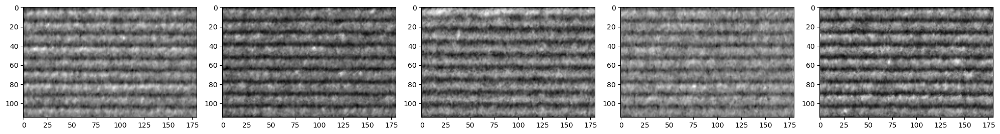

In [31]:
fig, axes = plt.subplots(1, 5, figsize=(20, 5))

images_plt = image_collection[41:46]

for i, img in enumerate(images_plt):
    
    axes[i].imshow(img, cmap='gray')

plt.tight_layout()
plt.show()

In [32]:
# ============================================================
# PHASE 1 — FALSE ALARM RATE
# ============================================================

n_false_alarms_p1 = int(np.sum(alarm_final_p1))
n_images_p1 = len(alarm_final_p1)

false_alarm_rate_p1 = n_false_alarms_p1 / n_images_p1

print("\n" + "=" * 60)
print("PHASE 1 — FALSE ALARM ANALYSIS")
print("=" * 60)
print(f"Number of Phase 1 images : {n_images_p1}")
print(f"False alarms             : {n_false_alarms_p1}")
print(f"False Alarm Rate         : {false_alarm_rate_p1:.4f}")
print("=" * 60)


PHASE 1 — FALSE ALARM ANALYSIS
Number of Phase 1 images : 132
False alarms             : 1
False Alarm Rate         : 0.0076


# Results

The final validation confirmed the effectiveness of the Patch-based MSPM strategy as the superior monitoring approach for this image-based dataset. The performance was evaluated by comparing the proposed multivariate model against the univariate benchmarks and the alternative PCA configurations.

**1. Performance of Univariate Benchmarks**

The comparison with the I-MR benchmark showed that while simple univariate charts are highly interpretable, they lack the spatial knowledge required for complex image data.
- Image Mean: As verified in the preliminary analysis, the image mean followed the Central Limit Theorem and passed the Run Test for independence. However, it proved competitive only when defects produced a significant shift in global intensity. Because the I-MR chart reduces 20,700 pixels to a single scalar, it suffers from a "dilution effect," ignoring the spatial arrangement and failing to detect localized anomalies. This method produced a single alarm in the Moving Range (MR) chart at index 111 (Image 112), which was subsequently classified as a false alarm. A comparative visual inspection of Image 112 alongside its four immediate neighbors confirmed that the signal was primarily driven by a global fluctuation in lighting, as the entire frame appears significantly darker than the baseline. Since the MR statistic measures the absolute difference between the means of successive images, this sudden shift in luminance was sufficient to breach the control limits, even though no structural defect or localized anomaly was present in the process.
- Dark_blob_score: This engineered metric outperformed the mean in detecting localized darkening. However, it still lacked the generalizability of the multivariate model, as it is specifically tuned only for one type of defect (dark clusters), potentially missing bright anomalies or textural changes. This approach failed to trigger any out-of-control signals. This lack of reactivity suggests a potential risk for a higher rate of false negatives (Type II errors) in Phase 2. This represents a significant limitation of the method, as its inability to signal deviations, even when subtle anomalies are present, indicates a lack of sensitivity that could compromise the reliability of the entire monitoring process.

**2. Final MSPM Configuration (Patch-based SPE)**

Among the tested multivariate strategies, the SPE statistic provided the most reliable detection performance.
- Sensitivity to Localized Defects: The proposed model demonstrated exceptional sensitivity, successfully identifying 100% of the simulated out-of-control images, including localized defects as small as  pixels. This high detection rate is attributable to the fact that such perturbations disrupt the spatial correlation structure meticulously learned during Phase I, triggering a sharp and unambiguous increase in the reconstruction error (SPE). While these results, obtained through artificial 'scribbles', serve as a preliminary validation rather than a final performance metric for Phase II, they provide essential support for the chosen methodology. However, by design, since the model evaluates features localized within small image segments, it possesses the necessary granularity to isolate and detect the majority of potential structural anomalies, ensuring they are not 'diluted' by the global variance of the process.
-  Diagnostic vs. Decision Metrics: Hotelling’s T2 was retained only as a diagnostic tool. Small "scribbles" do not necessarily produce a strong displacement within the retained principal component subspace, making less sensitive than SPE for this specific application.
- Parameter Tuning: A crucial phase of the design involved the optimization of the model's parameters, specifically the number of retained Principal Components. The selection process was not based solely on theoretical heuristics (such as the Scree Plot), but rather on an empirical data-driven approach using a synthetic Phase II dataset (the "scribbled" validation set). It is important to note that all model parameters, including the variance threshold and the control limit alpha are considered provisional. We acknowledge that further adjustments and "fine-tuning" may be necessary upon encountering the real Phase II dataset to ensure the optimal balance between sensitivity and robustness in a live production environment.

*Robustness and False Alarm Rate*

During Phase I validation, the model produced only one false alarm out of 132 images. This result is perfectly coherent with the chosen  alpha=0.0027, which statistically anticipates a small percentage of Type I errors even under stable conditions. This high level of specificity ensures that the model remains robust against the natural variability of the horizontal bands and minor acquisition noise.
Upon visual inspection of the flagged images, no assignable causes or physical defects were identified. For this reason, these observations were retained within the Phase I dataset to ensure the model accurately represents the process's inherent variability.

**4. Critique of Rejected Multivariate Approach**
   
Raw Pixel PCA: This approach confirmed that "more data" does not equal "better performance." Treating the image as a 20,700-dimensional vector introduced unnecessary complexity. This remained inferior to the patch-based method. The 30% variance elbow (first 2 PCs) suggested that while the global structure is simple, the local defects are "masked" by the dominant variance of the horizontal bands. Despite these current limitations, this method remains a viable secondary alternative to be re-evaluated during Phase 2. Its extreme computational simplicity and the fact that its first two scores follow a normal distribution make it a candidate for detecting large-scale systematic shifts. While it may lack the granularity for small anomalies, it could serve as a robust "fail-safe" or a simplified benchmark if the Phase 2 conditions require a less intensive processing approach.


**Conclusion**

The selected Patch-based MSPM method achieved the best balance between detection capability, robustness, and interpretability. Its key advantage is the 162-region decomposition (9 layers * 18 patches) **CHANGED IN PHASE 2 WITH 27 REGION DECOMPOSITION (9 LAYERS * 3 PATCHES)**, which preserves local spatial information while reducing dimensionality. The complexity of this framework is perfectly aligned with the nature of the data: it combines global layer structure with local patch sensitivity, providing a reliable "In-Control" model that treats the process as a structured entity rather than a collection of independent pixels. We acknowledge that the number of retained principal components is relatively high. However, this was a conscious design choice dictated by the high dimensionality of our feature matrix. Given that we are monitoring 162 distinct spatial regions **CHANGED IN PHASE 2 WITH 27 REGIONS** with different features, a high number of components is necessary to reach the 88% explained variance **CHANGED IN PHASE 2 WITH 12 PCs and 70% explained variance**. While a more parsimonious model might be simpler, it would risk "smoothing out" the very localized anomalies we aim to detect. This trade-off ensures that the model captures the intricate structural patterns of the process without becoming an over-simplified approximation.

To address this, we also tested a simplified version of the model based solely on features extracted from the 9 horizontal layers, which allowed for a much more parsimonious representation with only 9 Principal Components. However, despite its higher statistical efficiency, we decided to proceed with the more complex 162-region framework **CHANGED IN PHASE 2 27 REGION**. Our analysis confirmed that while the layer-based approach can identify broad process shifts, the patch-based decomposition is significantly more effective at isolating small, localized defects. By monitoring smaller portions of the image, we ensure that anomalies affecting only a limited area are not 'averaged out' or masked by the surrounding normal pixels, providing a much higher resolution for quality inspection.


# References
FOR THE FINAL METHODOLOGY: Alessandra Menafoglio, Marco Grasso, Piercesare Secchi & Bianca
Maria Colosimo (2018) Profile Monitoring of Probability Density Functions via Simplicial
Functional PCA With Application to Image Data, Technometrics, 60:4, 497-510, DOI:
10.1080/00401706.2018.1437473

Megahed, F. M., Woodall, W. H., & Camelio, J. A. (2011). A review and perspective on 
control charting with image data. Journal of Quality Technology, 43(2), 83–98. 
https://doi.org/10.1080/00224065.2011.11917850

# PHASE 2 -----------------------------

# INTRODUCTION

**Changes Compared to Phase I**

During Phase I, some parameters were selected based only on the available in-control images and the application of theory, after receiving the Phase II images and validating the method on the simulated defective samples, some choices were revised. The main changes and their motivations are reported below.
- First, the image partitioning strategy was simplified. In Phase I, each of the 9 layers had initially been divided into 18 patches. However, during Phase II validation, we observed that such a fine partition was not necessary to achieve good detection performance. Therefore, the number of patches was reduced to 3 per layer. This allowed us to work with a smaller feature matrix and to reduce the complexity of the method, while still obtaining very good monitoring results. In other words, a simpler and more parsimonious feature extraction strategy was sufficient to capture the relevant information needed to detect the defects.
- Second, the percentage of explained variance retained in the PCA model was reduced. Instead of retaining 88% of the variance, the final model was built by retaining 70% of the explained variance. This choice reduced the number of retained principal components to 12. This was useful because it made the PCA model more compact and efficient for monitoring purposes. In general, when the dimensionality and complexity of a multivariate monitoring model increase, the detection performance can become less efficient, since more parameters and directions of variability have to be estimated and monitored. This may lead to a higher out-of-control Average Run Length, meaning that more samples may be required before detecting a real shift. In the specific case of PCA-based monitoring, retaining too many components can also allow the model to reconstruct part of the abnormal variation, leaving smaller residuals and making localized defects less visible in the SPE statistic. On the other hand, retaining too few components would make the model too poor, increasing the residual error also for good images and potentially generating false alarms. Therefore, 70% represented a good compromise between model simplicity, monitoring efficiency, and defect detection capability.
- Some parts of the code were also modified and simplified after the lectures on PCA and Hotelling’s T².
- Moreover, a more detailed check of the normality assumption was added in Phase I. Since some principal components did not satisfy the normality assumption, we investigated which original variables had the largest influence on the non-normal PCs. Then, a Box-Cox transformation was applied to the most influential original variables in an attempt to improve normality. However, this procedure did not completely solve the problem: PC2 remained non-normal, and PC12 became non-normal after the transformation. Since PC12 explains only a small portion of the total variance, it could potentially have been excluded, but PC2 could not be removed because it contains relevant information. For this reason, we decided to use empirical control limits rather than theoretical limits, since empirical limits do not require the same strict normality assumptions.

**Final Selection of the Monitoring Statistic**

Although the preliminary Phase I analysis already suggested that SPE was the most suitable statistic for the final monitoring decision, the definitive choice was made only after the Phase II validation. In Phase I, both Hotelling’s T² and SPE were computed and compared, since they provide different types of information.
Hotelling’s T² monitors deviations within the retained PCA subspace, meaning that it detects abnormal variations along the principal components kept in the model. SPE, instead, measures the reconstruction error, namely the part of the image information that is not explained by the PCA model and remains in the residual subspace.
Since the anomalies considered in this study were mainly localized defects, they were expected to appear more clearly as residual reconstruction errors rather than as large shifts along the dominant principal directions. This expectation was confirmed during Phase II: the simulated defects produced a more consistent and reliable response in the SPE statistic than in Hotelling’s T². For this reason, SPE was selected as the final decision metric, while Hotelling’s T² was retained as a complementary diagnostic statistic.

# Preliminary data analysis

Before applying the PCA-based monitoring approach, a preliminary exploratory analysis was performed to compare the Phase I reference dataset with the Phase II monitoring dataset. Three main visual analyses were considered (as in phase 1): the mean image and standard deviation map, the pixel intensity distribution, and the run chart of the average pixel intensity.
Overall, the results show that Phase II preserves the same general horizontal layered structure observed in Phase I, confirming that the two datasets are comparable in terms of basic image pattern. However, Phase II also presents higher variability and stronger local deviations. This is visible both in the standard deviation map, where the dispersion is more intense and heterogeneous, and in the pixel intensity distributions, which appear less overlapped and more spread across the monitored images.
The run chart of the average pixel intensity further confirms that Phase II is less homogeneous than Phase I, with stronger fluctuations between consecutive images and some observations showing clearly lower or higher mean intensity values. Nevertheless, since the average intensity only captures global luminance variations, it is not sufficient to detect localized defects.
These preliminary findings justify the use of a localized and multivariate monitoring strategy. For this reason, the following analysis focuses on PCA-based monitoring statistics, especially SPE, which is more suitable for identifying local structural deviations that may not be visible through global image summaries alone.

> UPLOAD OF DATA (IMAGES)

In [33]:
paths2 = glob.glob('../Phase2 dataset/*.png')


# order the list
paths2.sort(key=extract_number)


# upload the images giving the ordered list
image_collection_2 = skimage.io.ImageCollection(paths2, as_gray=True)

# create the array Numpy
dataset_images_2 = image_collection_2.concatenate()
print("dataset dimension:", dataset_images_2.shape)

dataset_images_2_fixed = dataset_images_2.copy()

for i in range(dataset_images_2_fixed.shape[0]):
    if dataset_images_2_fixed[i].max() <= 1:
        dataset_images_2_fixed[i] = dataset_images_2_fixed[i] * 255

dataset_images_2_fixed = dataset_images_2_fixed /255


for i, img in enumerate(dataset_images_2_fixed):
    print(
        i+1,
        paths2[i].split('/')[-1],
        "min =", img.min(),
        "max =", img.max(),
        "mean =", img.mean()
    )


dataset dimension: (23, 115, 180)
1 image_1.png min = 0.0 max = 1.0 mean = 0.3491342237378043
2 image_2.png min = 0.0 max = 1.0 mean = 0.507872501657668
3 image_3.png min = 0.0 max = 1.0 mean = 0.46439765084777873
4 image_4.png min = 0.0 max = 1.0 mean = 0.39421331817751254
5 image_5.png min = 0.0 max = 1.0 mean = 0.4173719806763285
6 image_6.png min = 0.0 max = 1.0 mean = 0.3277262479871176
7 image_7.png min = 0.0 max = 1.0 mean = 0.4253359856019702
8 image_8.png min = 0.0 max = 1.0 mean = 0.4751107322155916
9 image_9.png min = 0.0 max = 1.0 mean = 0.41311338448422846
10 image_10.png min = 0.0 max = 1.0 mean = 0.5004586530264279
11 image_11.png min = 0.0 max = 1.0 mean = 0.5002805721322345
12 image_12.png min = 0.0 max = 1.0 mean = 0.2984569479965899
13 image_13.png min = 0.0 max = 1.0 mean = 0.24002121814909536
14 image_14.png min = 0.0 max = 1.0 mean = 0.45282030879984847
15 image_15.png min = 0.0 max = 1.0 mean = 0.3980901771336554
16 image_16.png min = 0.0 max = 1.0 mean = 0.40859

> preliminary analysis and data visualization

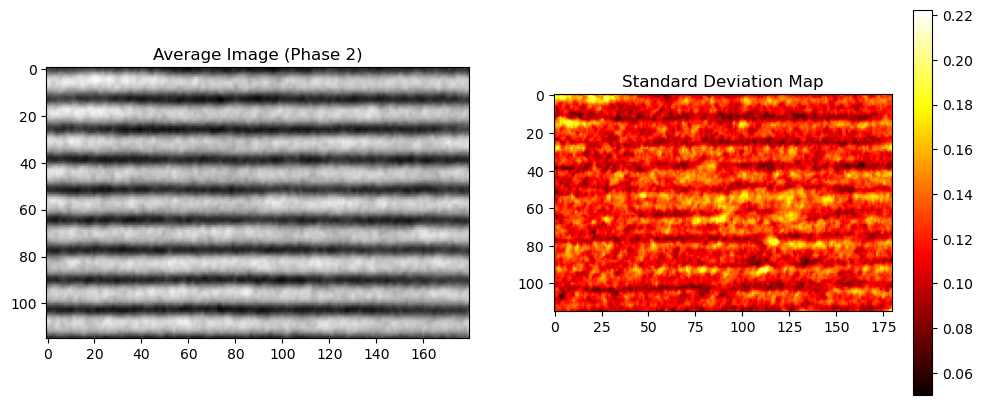

In [34]:
# compute mean and standard deviation along image axis
mean_img_2 = np.mean(dataset_images_2_fixed, axis=0)
std_img_2 = np.std(dataset_images_2_fixed, axis=0)

fig_2, ax_2 = plt.subplots(1, 2, figsize=(12, 5))

im1_2 = ax_2[0].imshow(mean_img_2, cmap='gray')
ax_2[0].set_title('Average Image (Phase 2)')
plt.colorbar(im1_2, ax=ax[0])

im2_2 = ax_2[1].imshow(std_img_2, cmap='hot') 
ax_2[1].set_title('Standard Deviation Map')
plt.colorbar(im2_2, ax=ax_2[1])

plt.show()
#the average image represents the ideal target 
#the standard deviation map shows unstable zone. if in this map a zone is ligher it means that it changes frequently between images

The visual inspection of the Phase II mean image confirms the presence of the same periodic horizontal pattern observed in Phase I, indicating that the main layered structure of the process is preserved also in the monitoring dataset. However, compared to Phase I, the image appears slightly more irregular, with some local intensity variations that are more evident along the horizontal bands. This suggests that Phase II images still follow the same general structure, but include additional local deviations that may be related to the defects.
The corresponding standard deviation map also confirms that the variability is not spatially uniform. As in Phase I, the highest dispersion is mainly located along the edges of the structural bands, showing that these regions are naturally more variable and therefore more informative for monitoring purposes. Compared with Phase I, the Phase II standard deviation map shows a wider range of variability, with values reaching approximately 0.20, while in Phase I the maximum variability was around 0.14–0.15. This increase indicates that Phase II contains stronger local variations, which is consistent with the presence of out-of-control images.
Overall, the comparison between Phase I and Phase II supports the choice of using a localized feature extraction approach. The persistence of the horizontal layered pattern confirms that the same segmentation strategy can be applied to both phases, while the increased and more heterogeneous variability in Phase II highlights the importance of monitoring local image features rather than relying only on global image statistics. 

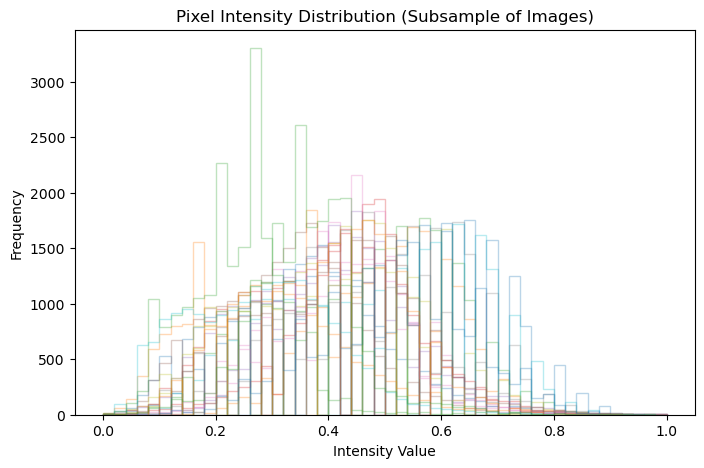

In [35]:
#needed to understand if the images have some illumination problems
plt.figure(figsize=(8, 5))
for i in range(0, 23): # plot all the images
    plt.hist(dataset_images_2_fixed[i].ravel(), bins=50, alpha=0.3, histtype='step')

plt.title("Pixel Intensity Distribution (Subsample of Images)")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")
plt.show()

The Pixel Intensity Distribution analysis for Phase II shows that the images still preserve a multimodal intensity structure, similarly to what was observed in Phase I. This confirms that the general luminance profile of the process remains comparable between the training and monitoring phases. However, compared to Phase I, the Phase II histograms appear more dispersed and less overlapped, with a wider spread of intensity values across the subsample of images.
In Phase I, the histograms were more consistent and strongly overlapped, suggesting a globally stable process during the training phase. The intensity peaks were concentrated in a relatively regular range, and no relevant pixel saturation was visible. In Phase II, instead, some observations show more pronounced deviations, with distributions extending more clearly toward both lower and higher intensity values. This indicates an increase in variability among images, which is coherent with the presence of defects.
Overall, the comparison between Phase I and Phase II confirms that the main pixel intensity structure is preserved, but Phase II presents a less stable and more heterogeneous distribution. 

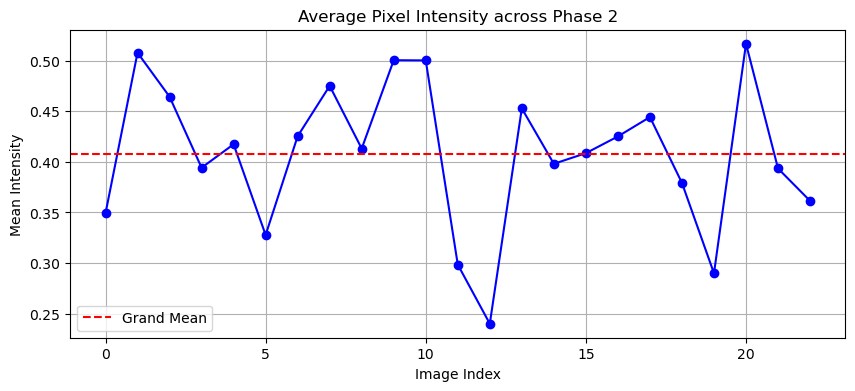

In [36]:
#plot of the images average along time
pixel_means_2 = np.mean(dataset_images_2_fixed, axis=(1, 2)) # Media di ogni singola immagine

plt.figure(figsize=(10, 4))
plt.plot(pixel_means_2, marker='o', linestyle='-', color='b')
plt.axhline(y=np.mean(pixel_means_2), color='r', linestyle='--', label='Grand Mean')
plt.title("Average Pixel Intensity across Phase 2")
plt.xlabel("Image Index")
plt.ylabel("Mean Intensity")
plt.legend()
plt.grid(True)
plt.show()

The Run Chart of the average pixel intensity for Phase II shows a stronger fluctuation of the mean intensity across the monitored images. The observations oscillate around a grand mean of approximately 0.41, but several images show marked deviations from this reference level, with values ranging from around 0.24 to more than 0.50. This indicates that the Phase II dataset is less homogeneous in terms of global luminance compared to Phase I.
In Phase I, the average pixel intensity fluctuated around a higher grand mean, approximately 0.47, and although short-term variability was present, the observations were distributed over a larger in-control training set without a clear systematic drift. In Phase II, instead, the smaller monitoring sample shows more pronounced jumps between consecutive images, including very low intensity values around image indexes 11–12 and 19, and higher values around indexes 1, 9–10, and 20. These stronger deviations suggest the presence of images with altered brightness or structural anomalies.
However, this chart is based only on the global average intensity of each image, so it cannot fully detect localized defects. An image may contain a local defect while maintaining an average intensity close to the grand mean. For this reason, the Phase II run chart is useful as an exploratory visualization, but it is not sufficient as the main monitoring tool. The comparison with Phase I confirms the need for a multivariate PCA-based approach, especially using SPE, which can better capture local structural deviations rather than only global changes in brightness.

# Test of your proposed approach on new data

In Phase II, the statistical process monitoring approaches designed during Phase I were applied to the new monitoring dataset. In particular, the methods considered were the I-MR control charts applied to the global image mean and to the dark_blob_score, and the PCA-based monitoring approach applied to the extracted feature matrix. As already discussed in the introductory section, the general monitoring strategy was defined in Phase I. After the Phase II validation, some implementation parameters were refined to obtain a more parsimonious and interpretable final configuration, while preserving the same core methodology.
The same main steps followed in Phase I were replicated on the Phase II dataset. First, the same feature extraction procedure was applied to the new images, in order to obtain a feature matrix with the same structure as the one used to build the Phase I model. Then, the Phase I preprocessing strategy was used to standardize the Phase II observations consistently with the training data. The PCA model estimated on Phase I was then applied to the Phase II feature matrix by projecting the new observations onto the Phase I principal component space. In this way, Phase II images were evaluated with respect to the in-control reference model built from Phase I, without re-estimating the PCA on the new data.
For the final monitoring decision, the SPE statistic was used as the main criterion, while Hotelling’s T² was kept mainly for diagnostic purposes. This choice is consistent with the objective of detecting localized structural defects in the images. Since the anomalies of Phase II may affect only limited regions of the image, they may not necessarily produce large changes in the PCA score space. As a consequence, T² may be less sensitive to these defects. On the other hand, SPE measures the part of each observation that is not well reconstructed by the PCA model, making it more suitable for identifying deviations from the normal image structure.
The assumption checks performed in Phase I were not repeated in Phase II, since Phase II is used as a test dataset and not to estimate the in-control model. The control limits and the reference behaviour were therefore inherited from Phase I, and the Phase II observations were assessed against these limits to identify possible out-of-control signals.
After detecting the out-of-control observations, a contribution analysis was carried out to better interpret the results. This analysis focused on identifying which layers, patches, and features contributed the most to the SPE value of each anomalous image. In this way, it was possible not only to flag defective observations, but also to understand which part of the image was mainly responsible for the alarm. This step was particularly useful for linking the statistical signal to the visual anomaly present in the image, improving the interpretability of the monitoring approach.
Overall, the application of the proposed method to Phase II confirmed the usefulness of the PCA-SPE monitoring strategy. The method was able to evaluate the new images with respect to the Phase I in-control reference condition and to highlight observations presenting abnormal structural behaviour. The additional contribution analysis provided a more detailed explanation of the detected alarms, supporting the interpretation of the out-of-control signals in terms of localized image defects.


** IMR APPROACH **

In [37]:
#create a dataframe with 132 row and 20700 column, that is 115row*180 column, so in each column we have one pixel

n_images_2 = dataset_images_2_fixed.shape[0]

df_pixels_2 = pd.DataFrame(
    dataset_images_2_fixed.reshape(n_images_2, -1)
)

print(df_pixels_2.shape)

(23, 20700)


In [38]:
mean_2 = df_pixels_2.mean(axis=1)
mean_2.shape
print(mean_2[14])

0.39809017713360245


In [39]:
phase_1_2=pd.concat([Y, mean_2], ignore_index=True).to_frame(name="sample_mean")

phase_1_2.shape

(155, 1)

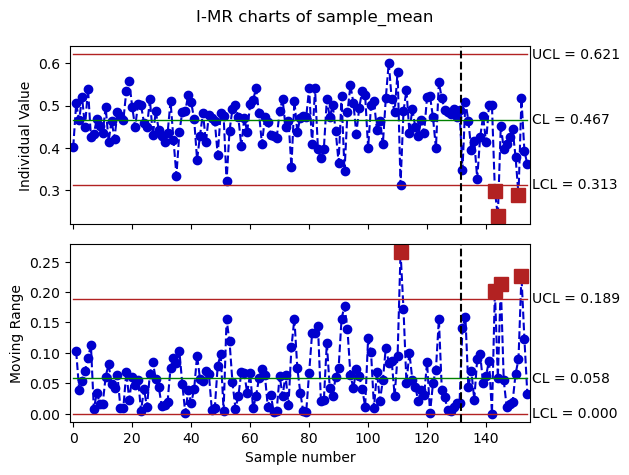

In [40]:
IMR_phase_1_2 = qda.ControlCharts.IMR(phase_1_2, 'sample_mean', subset_size=len(Y))

In [41]:
# INDEX OOC phase 2

# OOC ARE SAVED IN THE COLUMN I_TEST1
# - first 132 rows are for phase 1
# - then phase 2

ooc_global_idx = np.where(IMR_phase_1_2["I_TEST1"].notnull())[0]

# just OOC of phase 2
ooc_phase2_global_idx = ooc_global_idx[ooc_global_idx >= len(data_Xbar["sample_mean"])]

ooc_phase2_idx = ooc_phase2_global_idx - len(data_Xbar["sample_mean"]) + 1

print("index OOC Phase 2:")
print(ooc_phase2_idx.tolist())

print("\n OOC Phase 2:")
for idx in ooc_phase2_idx:
    print(
        f"image Phase 2 n. {idx} | "
        f"file: {paths2[idx-1].split('/')[-1]} | "
        f"mean = {mean_2.iloc[idx-1]:.6f}"
    )

index OOC Phase 2:
[12, 13, 20]

 OOC Phase 2:
image Phase 2 n. 12 | file: image_12.png | mean = 0.298457
image Phase 2 n. 13 | file: image_13.png | mean = 0.240021
image Phase 2 n. 20 | file: image_20.png | mean = 0.289834


> use of the second method with Sy 

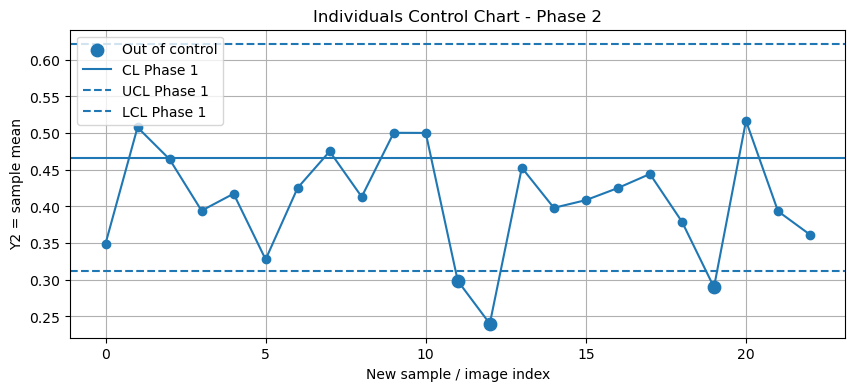

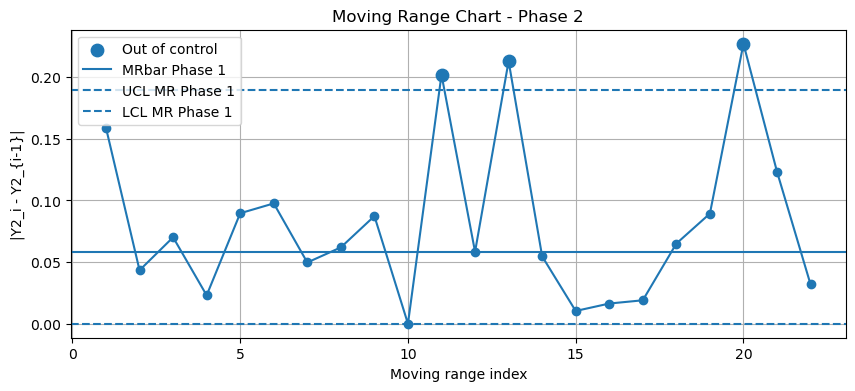

In [42]:
# phase2

Y2 = mean_2

CL = phase1_limits["CL"]
UCL = phase1_limits["UCL"]
LCL = phase1_limits["LCL"]

MRbar = phase1_limits["MRbar"]
UCL_MR = phase1_limits["UCL_MR"]
LCL_MR = phase1_limits["LCL_MR"]

out_of_control_2 = (Y2 > UCL) | (Y2 < LCL)

plt.figure(figsize=(10, 4))

plt.plot(Y2.index, Y2.values, marker='o', linestyle='-')
plt.scatter(
    Y2.index[out_of_control_2],
    Y2.loc[out_of_control_2].values,
    s=80,
    zorder=3,
    label='Out of control'
)

plt.axhline(CL, linestyle='-', label='CL Phase 1')
plt.axhline(UCL, linestyle='--', label='UCL Phase 1')
plt.axhline(LCL, linestyle='--', label='LCL Phase 1')

plt.title('Individuals Control Chart - Phase 2')
plt.xlabel('New sample / image index')
plt.ylabel('Y2 = sample mean')
plt.legend()
plt.grid(True)
plt.show()

#MR
MR2 = Y2.diff().abs().dropna()

out_of_control_MR2 = (MR2 > UCL_MR) | (MR2 < LCL_MR)

plt.figure(figsize=(10, 4))

plt.plot(MR2.index, MR2.values, marker='o', linestyle='-')
plt.scatter(
    MR2.index[out_of_control_MR2],
    MR2.loc[out_of_control_MR2].values,
    s=80,
    zorder=3,
    label='Out of control'
)

plt.axhline(MRbar, linestyle='-', label='MRbar Phase 1')
plt.axhline(UCL_MR, linestyle='--', label='UCL MR Phase 1')
plt.axhline(LCL_MR, linestyle='--', label='LCL MR Phase 1')

plt.title('Moving Range Chart - Phase 2')
plt.xlabel('Moving range index')
plt.ylabel('|Y2_i - Y2_{i-1}|')
plt.legend()
plt.grid(True)
plt.show()

In [43]:
score_2 = dark_blob_score(dataset_images_2_fixed, window=17)

print("\nScore Phase 2:")
print(score_2.describe())

print("\nPrime 10 immagini Phase 2:")
print(score_2.head(10))



Score Phase 2:
count    23.000000
mean      0.113762
std       0.030172
min       0.068684
25%       0.099773
50%       0.110336
75%       0.125276
max       0.222891
dtype: float64

Prime 10 immagini Phase 2:
0    0.129798
1    0.068684
2    0.114442
3    0.109201
4    0.131735
5    0.115364
6    0.129102
7    0.100296
8    0.125821
9    0.099251
dtype: float64


In [44]:
phase_blob = pd.concat(
    [score_1, score_2],
    ignore_index=True
).to_frame(name="dark_blob_score")

print(phase_blob.shape)
print(phase_blob.head())
print(phase_blob.tail())

(155, 1)
   dark_blob_score
0         0.098887
1         0.081111
2         0.123043
3         0.118233
4         0.081466
     dark_blob_score
150         0.075038
151         0.089292
152         0.098364
153         0.114695
154         0.222891


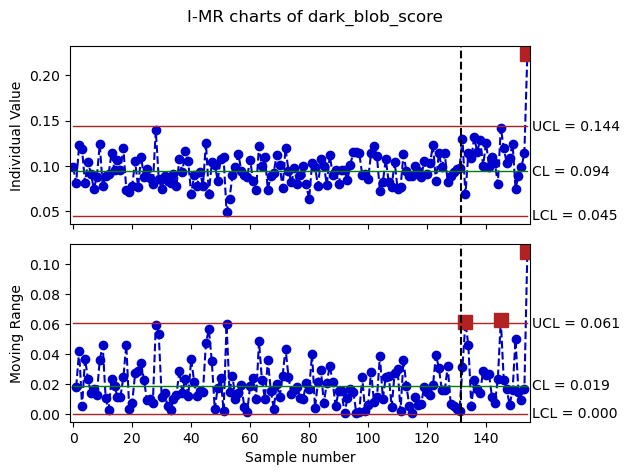

In [45]:
IMR_blob = qda.ControlCharts.IMR(
    phase_blob,
    "dark_blob_score",
    subset_size=len(score_1)
)

In [46]:
ooc_global_idx_I = np.where(IMR_blob["I_TEST1"].notnull())[0]
ooc_global_idx_MR = np.where(IMR_blob["MR_TEST1"].notnull())[0]

# transform in phase 2 indexes
ooc_phase2_idx_I = ooc_global_idx_I - len(score_1) +1 
ooc_phase2_idx_MR = ooc_global_idx_MR - len(score_1) + 1

print("PHASE 2 OOC I:")
print(ooc_phase2_idx_I.tolist())

print("PHASE 2 OOC MR:")
print(ooc_phase2_idx_MR.tolist())

PHASE 2 OOC I:
[23]
PHASE 2 OOC MR:
[2, 14, 23]


**PATCH BASED SPE APPROACH**


In Phase 2, the fitted Phase 1 model is applied to the new images.

The Phase 2 images are loaded and processed using the same layer boundaries, feature extraction procedure and scaler estimated in Phase 1. Then, the Phase 2 features are projected onto the PCA model learned from Phase 1.

For each new image, T² and SPE are computed. The final out-of-control decision is based only on SPE: an image is classified as OOC when its SPE value exceeds the Phase 1 SPE control limit.

Shewhart charts are also computed as a reference benchmark, but they are not used for the final decision.


PHASE 2 
Phase 2 images: 23
first 5: ['image_1.png', 'image_2.png', 'image_3.png', 'image_4.png', 'image_5.png']
last 5: ['image_19.png', 'image_20.png', 'image_21.png', 'image_22.png', 'image_23.png']

Extraction phase 2 features...


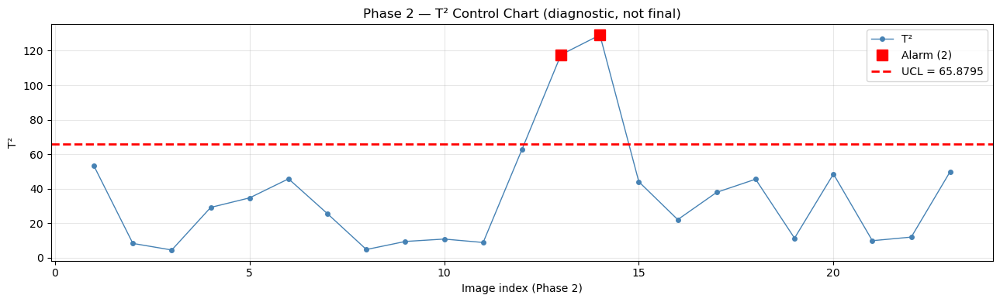

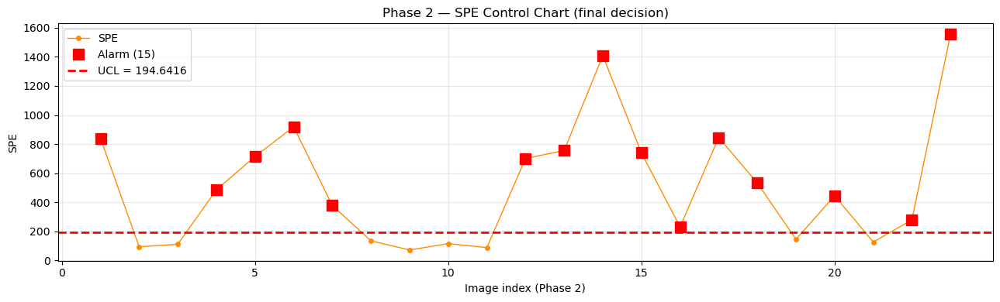


 Phase 2 PCA alarms:
T² : 2 / 23
SPE    : 15 / 23
OOC SPE indexes: [1, 4, 5, 6, 7, 12, 13, 14, 15, 16, 17, 18, 20, 22, 23]
img   1: image_1.png | T²=53.1608 | SPE=839.9459
img   4: image_4.png | T²=29.0665 | SPE=485.6621
img   5: image_5.png | T²=34.6116 | SPE=715.0255
img   6: image_6.png | T²=45.6621 | SPE=918.3261
img   7: image_7.png | T²=25.4232 | SPE=377.2071
img  12: image_12.png | T²=62.8671 | SPE=700.8631
img  13: image_13.png | T²=117.6675 | SPE=755.7283
img  14: image_14.png | T²=129.1147 | SPE=1408.6190
img  15: image_15.png | T²=43.9646 | SPE=739.8573
img  16: image_16.png | T²=21.9949 | SPE=230.1639
img  17: image_17.png | T²=37.8235 | SPE=845.4812
img  18: image_18.png | T²=45.4423 | SPE=532.2952
img  20: image_20.png | T²=48.4714 | SPE=444.6168
img  22: image_22.png | T²=11.8578 | SPE=278.0785
img  23: image_23.png | T²=49.8964 | SPE=1555.1549


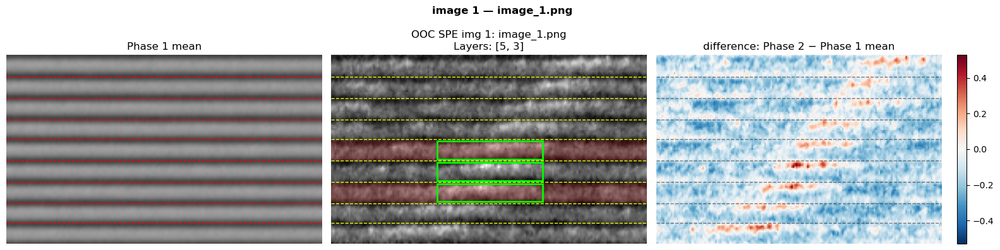


Top contribution features — image 1:


,feature_index,layer,patch,type,contribution,residual,row_start,row_end,col_start,col_end
0,169,5,2,patch_bright_mean_score,89.004350,9.434212,52,63,60,120
1,133,4,2,patch_bright_mean_score,52.188960,7.224193,65,76,60,120
2,97,3,2,patch_bright_mean_score,39.521411,6.286606,78,89,60,120
3,67,2,3,patch_dark_mean_score,36.646391,6.053626,91,101,120,180
4,93,3,1,patch_contrast_score,29.709373,-5.450630,78,89,0,60
5,320,9,3,patch_bright_mean_score,29.067221,5.391403,0,12,120,180
6,312,9,2,patch_dark_mean_score,24.552112,4.955009,0,12,60,120
7,19,1,1,patch_bright_mean_score,22.513393,4.744828,103,115,0,60
8,70,2,3,patch_bright_fraction,15.696288,-3.961854,91,101,120,180
9,136,4,2,patch_contrast_score,14.912061,3.861614,65,76,60,120


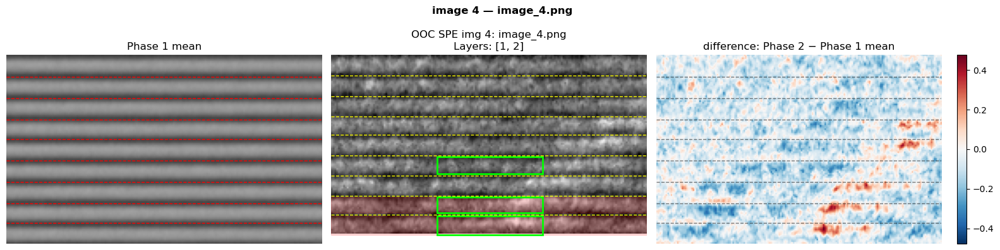


Top contribution features — image 4:


,feature_index,layer,patch,type,contribution,residual,row_start,row_end,col_start,col_end
0,26,1,2,patch_bright_mean_score,54.950219,7.412842,103,115,60,120
1,61,2,2,patch_bright_mean_score,23.958660,4.894758,91,101,60,120
2,132,4,2,patch_dark_mean_score,22.527775,4.746343,65,76,60,120
3,53,2,1,patch_dark_mean_score,20.854195,4.566639,91,101,0,60
4,28,1,2,patch_bright_fraction,19.984501,4.470403,103,115,60,120
5,29,1,2,patch_contrast_score,18.072104,4.251130,103,115,60,120
6,211,6,3,patch_bright_mean_score,17.036883,4.127576,40,50,120,180
7,213,6,3,patch_bright_fraction,16.622350,4.077052,40,50,120,180
8,64,2,2,patch_contrast_score,15.552024,3.943605,91,101,60,120
9,203,6,2,patch_dark_mean_score,15.455897,3.931399,40,50,60,120


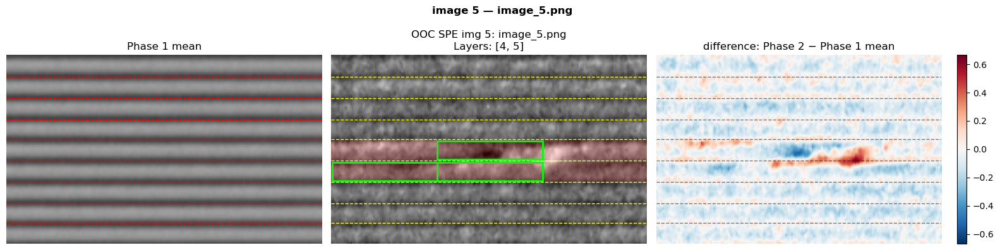


Top contribution features — image 5:


,feature_index,layer,patch,type,contribution,residual,row_start,row_end,col_start,col_end
0,133,4,2.0,patch_bright_mean_score,144.313352,12.013049,65,76,60,120
1,168,5,2.0,patch_dark_mean_score,100.566988,10.028309,52,63,60,120
2,125,4,1.0,patch_dark_mean_score,41.396963,6.434047,65,76,0,60
3,165,5,1.0,patch_contrast_score,40.643496,-6.375225,52,63,0,60
4,134,4,2.0,patch_dark_fraction,39.499183,-6.284838,65,76,60,120
5,170,5,2.0,patch_dark_fraction,28.348640,5.324344,52,63,60,120
6,163,5,1.0,patch_dark_fraction,12.858870,-3.585927,52,63,0,60
7,162,5,1.0,patch_bright_mean_score,12.554407,3.543220,52,63,0,60
8,135,4,2.0,patch_bright_fraction,12.354807,3.514941,65,76,60,120
9,127,4,1.0,patch_dark_fraction,10.006620,3.163324,65,76,0,60


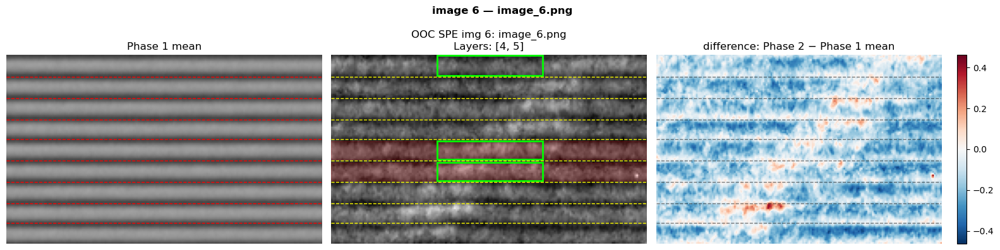


Top contribution features — image 6:


,feature_index,layer,patch,type,contribution,residual,row_start,row_end,col_start,col_end
0,133,4,2,patch_bright_mean_score,100.836964,10.041761,65,76,60,120
1,169,5,2,patch_bright_mean_score,97.013537,9.849545,52,63,60,120
2,312,9,2,patch_dark_mean_score,58.744349,7.664486,0,12,60,120
3,19,1,1,patch_bright_mean_score,36.608793,6.050520,103,115,0,60
4,320,9,3,patch_bright_mean_score,32.577616,5.707680,0,12,120,180
5,67,2,3,patch_dark_mean_score,30.560043,5.528114,91,101,120,180
6,161,5,1,patch_dark_mean_score,23.303824,4.827403,52,63,0,60
7,54,2,1,patch_bright_mean_score,22.800888,4.775027,91,101,0,60
8,134,4,2,patch_dark_fraction,19.736685,-4.442599,65,76,60,120
9,204,6,2,patch_bright_mean_score,15.441408,3.929556,40,50,60,120


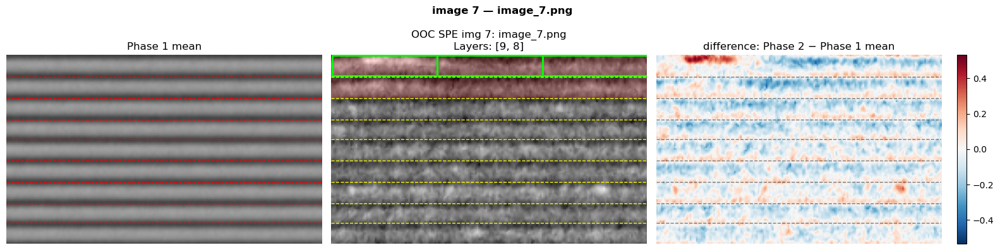


Top contribution features — image 7:


,feature_index,layer,patch,type,contribution,residual,row_start,row_end,col_start,col_end
0,312,9,2,patch_dark_mean_score,33.238207,5.765259,0,12,60,120
1,323,9,3,patch_contrast_score,28.789169,-5.365554,0,12,120,180
2,306,9,1,patch_bright_mean_score,27.405510,5.235027,0,12,0,60
3,275,8,2,patch_dark_mean_score,16.462317,4.057378,14,25,60,120
4,321,9,3,patch_dark_fraction,9.104796,-3.017415,0,12,120,180
5,70,2,3,patch_bright_fraction,8.435802,-2.904445,91,101,120,180
6,68,2,3,patch_bright_mean_score,7.892326,-2.809328,91,101,120,180
7,279,8,2,patch_contrast_score,7.603259,-2.757401,14,25,60,120
8,233,7,1,patch_bright_mean_score,7.136840,-2.671486,27,38,0,60
9,129,4,1,patch_contrast_score,7.030862,-2.651577,65,76,0,60


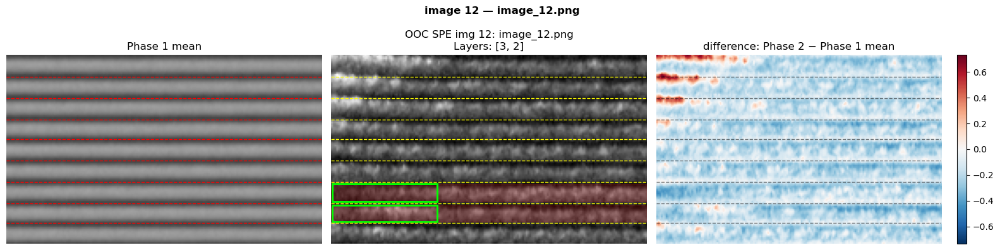


Top contribution features — image 12:


,feature_index,layer,patch,type,contribution,residual,row_start,row_end,col_start,col_end
0,89,3,1,patch_dark_mean_score,83.569406,9.141630,78,89,0,60
1,54,2,1,patch_bright_mean_score,39.288795,6.268077,91,101,0,60
2,93,3,1,patch_contrast_score,31.721418,-5.632177,78,89,0,60
3,279,8,2,patch_contrast_score,26.908775,-5.187367,14,25,60,120
4,316,9,2,patch_contrast_score,26.840436,-5.180776,0,12,60,120
5,323,9,3,patch_contrast_score,21.479006,-4.634545,0,12,120,180
6,272,8,1,patch_contrast_score,20.892137,4.570792,14,25,0,60
7,69,2,3,patch_dark_fraction,20.057896,4.478604,91,101,120,180
8,306,9,1,patch_bright_mean_score,18.709652,4.325465,0,12,0,60
9,104,3,3,patch_bright_mean_score,18.510805,4.302418,78,89,120,180


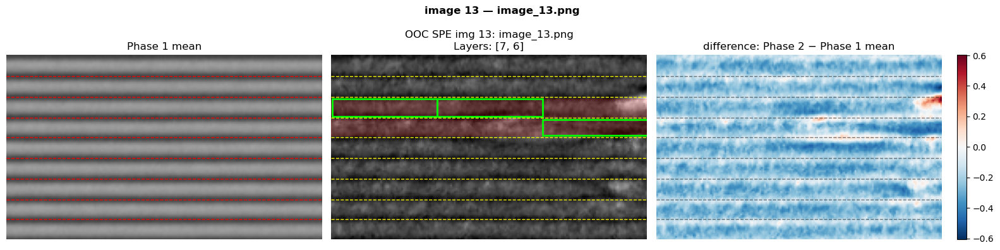


Top contribution features — image 13:


,feature_index,layer,patch,type,contribution,residual,row_start,row_end,col_start,col_end
0,236,7,1,patch_contrast_score,77.694471,-8.814447,27,38,0,60
1,239,7,2,patch_dark_mean_score,67.539785,8.218259,27,38,60,120
2,210,6,3,patch_dark_mean_score,56.260991,7.500733,40,50,120,180
3,243,7,2,patch_contrast_score,43.659282,-6.607517,27,38,60,120
4,276,8,2,patch_bright_mean_score,40.794000,6.387018,14,25,60,120
5,204,6,2,patch_bright_mean_score,25.977217,5.096785,40,50,60,120
6,247,7,3,patch_bright_mean_score,24.222419,4.921628,27,38,120,180
7,234,7,1,patch_dark_fraction,16.583309,-4.072261,27,38,0,60
8,245,7,3,patch_std,14.800480,3.847139,27,38,120,180
9,140,4,3,patch_bright_mean_score,12.873063,-3.587905,65,76,120,180


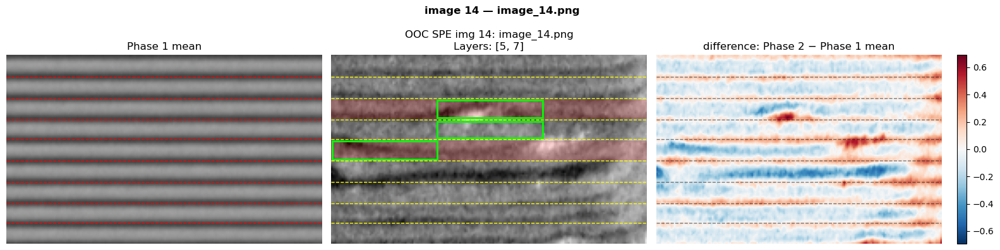


Top contribution features — image 14:


,feature_index,layer,patch,type,contribution,residual,row_start,row_end,col_start,col_end
0,161,5,1,patch_dark_mean_score,144.869236,12.036164,52,63,0,60
1,243,7,2,patch_contrast_score,108.862195,10.433705,27,38,60,120
2,204,6,2,patch_bright_mean_score,88.320438,9.397895,40,50,60,120
3,89,3,1,patch_dark_mean_score,65.352870,8.084112,78,89,0,60
4,107,3,3,patch_contrast_score,53.936254,-7.344131,78,89,120,180
5,179,5,3,patch_contrast_score,47.074381,-6.861077,52,63,120,180
6,170,5,2,patch_dark_fraction,36.210569,-6.017522,52,63,60,120
7,138,4,3,patch_std,35.687122,5.973870,65,76,120,180
8,100,3,2,patch_contrast_score,33.163432,-5.758770,78,89,60,120
9,250,7,3,patch_contrast_score,32.065986,-5.662684,27,38,120,180


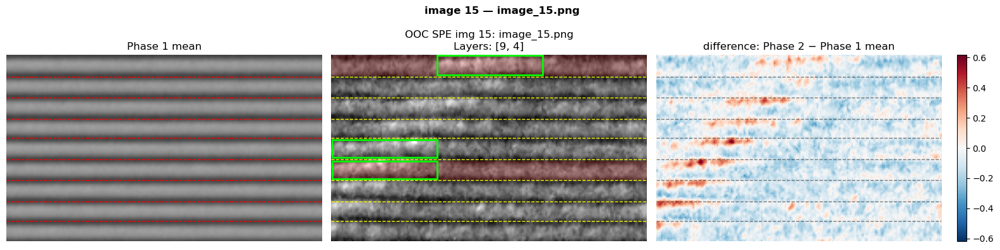


Top contribution features — image 15:


,feature_index,layer,patch,type,contribution,residual,row_start,row_end,col_start,col_end
0,313,9,2,patch_bright_mean_score,112.468563,10.605120,0,12,60,120
1,126,4,1,patch_bright_mean_score,49.208800,7.014898,65,76,0,60
2,162,5,1,patch_bright_mean_score,42.010144,6.481523,52,63,0,60
3,309,9,1,patch_contrast_score,40.288922,-6.347355,0,12,0,60
4,276,8,2,patch_bright_mean_score,33.558910,5.793005,14,25,60,120
5,132,4,2,patch_dark_mean_score,24.537680,4.953552,65,76,60,120
6,128,4,1,patch_bright_fraction,20.675581,4.547041,65,76,0,60
7,305,9,1,patch_dark_mean_score,18.005518,4.243291,0,12,0,60
8,164,5,1,patch_bright_fraction,13.004666,3.606198,52,63,0,60
9,136,4,2,patch_contrast_score,12.681059,-3.561047,65,76,60,120


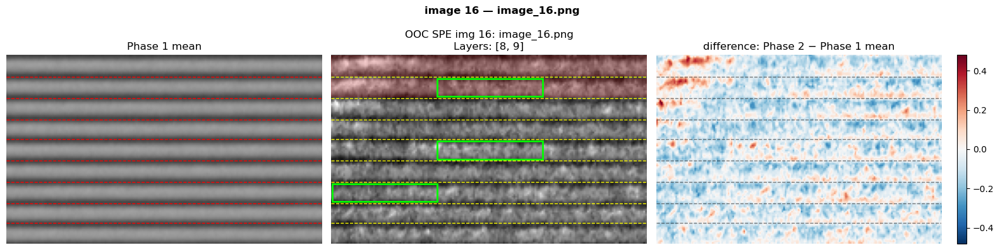


Top contribution features — image 16:


,feature_index,layer,patch,type,contribution,residual,row_start,row_end,col_start,col_end
0,89,3,1,patch_dark_mean_score,15.798264,3.974703,78,89,0,60
1,279,8,2,patch_contrast_score,13.775827,-3.711580,14,25,60,120
2,169,5,2,patch_bright_mean_score,12.944612,3.597862,52,63,60,120
3,239,7,2,patch_dark_mean_score,12.051758,3.471564,27,38,60,120
4,323,9,3,patch_contrast_score,7.009287,-2.647506,0,12,120,180
5,312,9,2,patch_dark_mean_score,6.428774,2.535503,0,12,60,120
6,309,9,1,patch_contrast_score,5.933643,2.435907,0,12,0,60
7,272,8,1,patch_contrast_score,5.160709,2.271719,14,25,0,60
8,29,1,2,patch_contrast_score,5.005702,2.237343,103,115,60,120
9,246,7,3,patch_dark_mean_score,4.998620,-2.235759,27,38,120,180


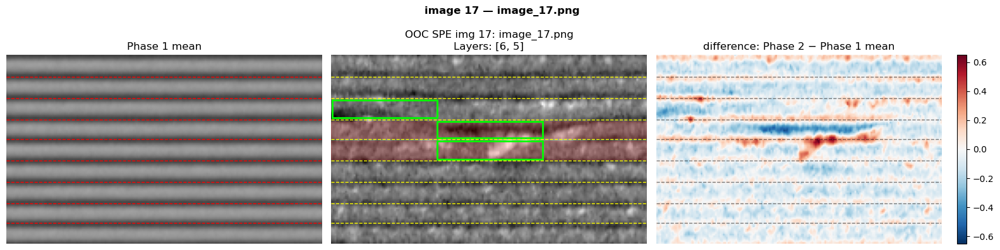


Top contribution features — image 17:


,feature_index,layer,patch,type,contribution,residual,row_start,row_end,col_start,col_end
0,203,6,2,patch_dark_mean_score,81.710357,9.039378,40,50,60,120
1,169,5,2,patch_bright_mean_score,53.719121,7.329333,52,63,60,120
2,232,7,1,patch_dark_mean_score,53.384283,7.306455,27,38,0,60
3,205,6,2,patch_dark_fraction,44.888816,6.699912,40,50,60,120
4,247,7,3,patch_bright_mean_score,37.544088,6.127323,27,38,120,180
5,179,5,3,patch_contrast_score,36.915700,-6.075829,52,63,120,180
6,172,5,2,patch_contrast_score,29.436675,5.425558,52,63,60,120
7,200,6,1,patch_contrast_score,26.675909,-5.164873,40,50,0,60
8,170,5,2,patch_dark_fraction,22.772109,-4.772013,52,63,60,120
9,243,7,2,patch_contrast_score,19.906587,-4.461680,27,38,60,120


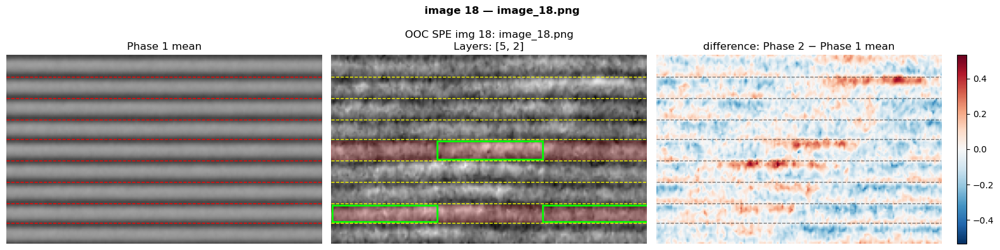


Top contribution features — image 18:


,feature_index,layer,patch,type,contribution,residual,row_start,row_end,col_start,col_end
0,169,5,2,patch_bright_mean_score,70.251691,8.381628,52,63,60,120
1,67,2,3,patch_dark_mean_score,31.332209,5.597518,91,101,120,180
2,54,2,1,patch_bright_mean_score,27.025747,5.198629,91,101,0,60
3,268,8,1,patch_dark_mean_score,22.781525,4.773000,14,25,0,60
4,283,8,3,patch_bright_mean_score,20.987108,4.581169,14,25,120,180
5,161,5,1,patch_dark_mean_score,16.872903,4.107664,52,63,0,60
6,93,3,1,patch_contrast_score,11.307804,-3.362708,78,89,0,60
7,70,2,3,patch_bright_fraction,10.424427,-3.228688,91,101,120,180
8,133,4,2,patch_bright_mean_score,8.739067,2.956191,65,76,60,120
9,56,2,1,patch_bright_fraction,8.359948,2.891357,91,101,0,60


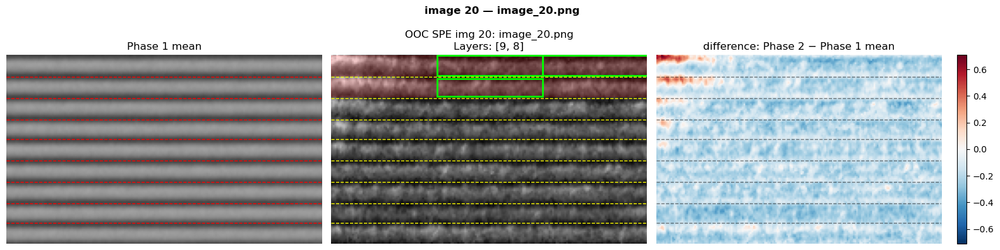


Top contribution features — image 20:


,feature_index,layer,patch,type,contribution,residual,row_start,row_end,col_start,col_end
0,279,8,2,patch_contrast_score,40.496477,-6.363684,14,25,60,120
1,323,9,3,patch_contrast_score,28.492023,-5.337792,0,12,120,180
2,316,9,2,patch_contrast_score,27.804001,-5.272950,0,12,60,120
3,306,9,1,patch_bright_mean_score,16.088982,4.011107,0,12,0,60
4,239,7,2,patch_dark_mean_score,12.927656,3.595505,27,38,60,120
5,312,9,2,patch_dark_mean_score,11.085871,3.329545,0,12,60,120
6,197,6,1,patch_bright_mean_score,10.721440,3.274361,40,50,0,60
7,129,4,1,patch_contrast_score,10.546309,-3.247508,65,76,0,60
8,246,7,3,patch_dark_mean_score,10.481156,-3.237461,27,38,120,180
9,128,4,1,patch_bright_fraction,9.534467,-3.087793,65,76,0,60


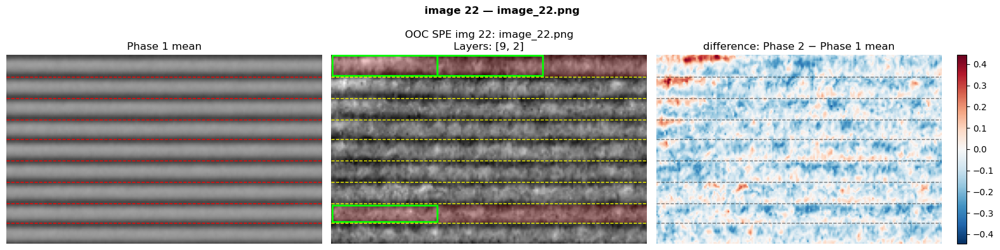


Top contribution features — image 22:


,feature_index,layer,patch,type,contribution,residual,row_start,row_end,col_start,col_end
0,312,9,2,patch_dark_mean_score,30.709412,5.541607,0,12,60,120
1,54,2,1,patch_bright_mean_score,18.671415,4.321043,91,101,0,60
2,306,9,1,patch_bright_mean_score,15.986162,3.998270,0,12,0,60
3,308,9,1,patch_bright_fraction,8.364778,2.892193,0,12,0,60
4,272,8,1,patch_contrast_score,7.646917,2.765306,14,25,0,60
5,323,9,3,patch_contrast_score,7.638817,-2.763841,0,12,120,180
6,234,7,1,patch_dark_fraction,6.599640,2.568976,27,38,0,60
7,169,5,2,patch_bright_mean_score,6.014532,2.452454,52,63,60,120
8,271,8,1,patch_bright_fraction,5.715846,2.390784,14,25,0,60
9,267,8,1,patch_std,5.480119,2.340965,14,25,0,60


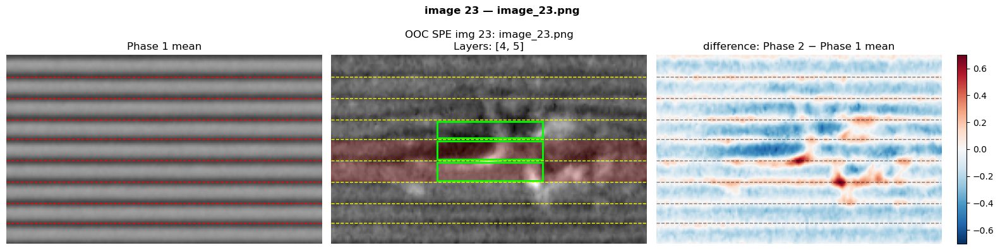


Top contribution features — image 23:


,feature_index,layer,patch,type,contribution,residual,row_start,row_end,col_start,col_end
0,203,6,2,patch_dark_mean_score,88.750184,9.420732,40,50,60,120
1,172,5,2,patch_contrast_score,78.086045,8.836631,52,63,60,120
2,133,4,2,patch_bright_mean_score,74.124215,8.609542,65,76,60,120
3,129,4,1,patch_contrast_score,73.663436,-8.582741,65,76,0,60
4,170,5,2,patch_dark_fraction,68.030012,8.248031,52,63,60,120
5,211,6,3,patch_bright_mean_score,63.685009,7.980289,40,50,120,180
6,19,1,1,patch_bright_mean_score,59.601024,7.720170,103,115,0,60
7,179,5,3,patch_contrast_score,58.618908,-7.656299,52,63,120,180
8,134,4,2,patch_dark_fraction,58.488778,-7.647796,65,76,60,120
9,239,7,2,patch_dark_mean_score,51.396443,7.169131,27,38,60,120


In [47]:
# phase 2

print("\n" + "=" * 65)
print("PHASE 2 ")
print("=" * 65)

images_p2, files_p2 = load_folder(PHASE2_FOLDER)

N2 = images_p2.shape[0]

print(f"Phase 2 images: {N2}")
print(f"first 5: {files_p2[:5]}")
print(f"last 5: {files_p2[-5:]}")

print("\nExtraction phase 2 features...")

X_p2, _ = build_feature_matrix(images_p2, layer_slices) #we use this function to build the same feature matrix built at phase 1

X_p2_scaled = scaler.transform(X_p2) #standardization

T2_p2, SPE_p2, scores_p2, residuals_p2 = apply_pca(X_p2_scaled, pca, eig) #we apply the PCA defined in the phase 1 

idx_p2 = np.arange(1, N2 + 1)

alarms_T2_p2_raw = T2_p2 > T2_UCL #we use the same UCL identified in phase 1, as here we are using empirical control limits we don't have to recompute them for phase 2 as if we were using theoretical control limits
alarms_SPE_p2_raw = SPE_p2 > SPE_UCL

alarm_final_p2 = alarms_SPE_p2_raw

plot_control_chart(
    idx_p2,
    T2_p2,
    T2_UCL,
    label="T²",
    title="Phase 2 — T² Control Chart (diagnostic, not final)",
    phase="Phase 2",
    alarm_mask=alarms_T2_p2_raw
)

plot_control_chart(
    idx_p2,
    SPE_p2,
    SPE_UCL,
    label="SPE",
    title="Phase 2 — SPE Control Chart (final decision)",
    color="darkorange",
    phase="Phase 2",
    alarm_mask=alarm_final_p2
)

print(f"\n Phase 2 PCA alarms:")
print(f"T² : {alarms_T2_p2_raw.sum()} / {N2}")
print(f"SPE    : {alarm_final_p2.sum()} / {N2}")

if alarm_final_p2.any():
    print(f"OOC SPE indexes: {list(np.where(alarm_final_p2)[0] + 1)}")

    for i in np.where(alarm_final_p2)[0]:
        print(
            f"img {i+1:3d}: {files_p2[i]} | "
            f"T²={T2_p2[i]:.4f} | SPE={SPE_p2[i]:.4f}"
        )


alarm_final_project = alarm_final_p2



df_compare = pd.DataFrame({
    "image": np.arange(1, N2 + 1),
    "file": files_p2,
    "T2": T2_p2,
    "SPE": SPE_p2,
    "alarm_T2_diagnostic": alarms_T2_p2_raw,
    "alarm_SPE_final": alarm_final_p2,
    "alarm_PCA_final": alarm_final_project,
})

#it show the OOC images: for each OOC it show the average image of phase 1, the OOC image highiliting the suspected layer, a table with the features that
#have contributed the most (top_contribution_features), and the differences map
#by looking at this plot we can identify which are the features responsible for the OOC. 
#Since the monitoring scheme is based on both Hotelling’s T² and SPE statistics, two different interpretation approaches can be considered. 
# For T² alarms, the contribution of each principal component can be evaluated through the normalized squared scores, and the corresponding 
# loadings can be inspected to identify the original variables mainly involved. For SPE alarms, instead, the residuals are already expressed in the original 
# feature space; therefore, the largest squared residuals directly identify the original image features, layers or patches responsible for the anomaly.
if SHOW_ALL_OOC_IMAGES and alarm_final_project.any():
    plot_ooc_images(
        images_p2,
        files_p2,
        alarm_final_project,
        residuals_p2,
        feature_info,
        boundaries,
        layer_slices,
        images_p1_mean=mean_img_p1,
        title_prefix="OOC SPE"
    )


# Discussion

# performance metrics IMR approach

In [48]:
# ============================================================
# PHASE 2 — PERFORMANCE METRICS FOR MEAN-BASED IMR METHOD
# ============================================================


y_true_p2 = np.array([
    1, 0, 0, 1, 1,
    1, 1, 0, 0, 0,
    0, 1, 1, 1, 1,
    1, 1, 1, 0, 1,
    0, 1, 1
]).astype(int)

# Model predictions from the Individuals chart on Y2
# 1 = predicted OOC
# 0 = predicted IC
y_pred_p2_mean = np.asarray(out_of_control_2).astype(int)

metrics_p2_mean = compute_metrics(y_true_p2, y_pred_p2_mean)

print("\n" + "=" * 80)
print("PHASE 2 — TRUE VS PREDICTED LABELS — MEAN-BASED METHOD")
print("=" * 80)

for fname, true, pred in zip(paths2, y_true_p2, y_pred_p2_mean):
    status = "OK" if true == pred else "WRONG"
    print(f"{os.path.basename(fname):20s} | true={true} | pred={pred} | {status}")

print("=" * 80)


PERFORMANCE METRICS
TP (True Positive)   : 3
TN (True Negative)   : 8
FP (False Positive)  : 0
FN (False Negative)  : 12
------------------------------------------------------------
Accuracy             : 0.4783
Precision            : 1.0000
Recall               : 0.2000
F1 Score             : 0.3333
False Alarm Rate     : 0.0000
Missed Detection Rate: 0.8000

PHASE 2 — TRUE VS PREDICTED LABELS — MEAN-BASED METHOD
image_1.png          | true=1 | pred=0 | WRONG
image_2.png          | true=0 | pred=0 | OK
image_3.png          | true=0 | pred=0 | OK
image_4.png          | true=1 | pred=0 | WRONG
image_5.png          | true=1 | pred=0 | WRONG
image_6.png          | true=1 | pred=0 | WRONG
image_7.png          | true=1 | pred=0 | WRONG
image_8.png          | true=0 | pred=0 | OK
image_9.png          | true=0 | pred=0 | OK
image_10.png         | true=0 | pred=0 | OK
image_11.png         | true=0 | pred=0 | OK
image_12.png         | true=1 | pred=1 | OK
image_13.png         | true=1 | pred=1

In [49]:
# ============================================================
# PHASE 2 — PERFORMANCE METRICS FOR DARK BLOB METHOD
# ============================================================

# Ground truth labels for Phase 2
# 1 = OOC / defective
# 0 = IC / normal

y_true_p2 = np.array([
    1, 0, 0, 1, 1,
    1, 1, 0, 0, 0,
    0, 1, 1, 1, 1,
    1, 1, 1, 0, 1,
    0, 1, 1
]).astype(int)


n_p2 = len(paths2)

y_pred_p2_blob_final = np.zeros(n_p2, dtype=int)

# Combine I-chart and MR-chart alarms
ooc_phase2_idx_final = np.unique(
    np.concatenate([
        np.asarray(ooc_phase2_idx_I, dtype=int),
        np.asarray(ooc_phase2_idx_MR, dtype=int)
    ])
)


# Convert image IDs to Python positions
# image_1 -> position 0
# image_13 -> position 12
# image_22 -> position 21
y_pred_p2_blob_final[ooc_phase2_idx_final - 1] = 1

print("\nFinal OOC Phase 2 image IDs used for metrics:")
print(ooc_phase2_idx_final.tolist())


metrics_p2_blob_final = compute_metrics(y_true_p2, y_pred_p2_blob_final)

print("\n" + "=" * 80)
print("PHASE 2 — TRUE VS PREDICTED LABELS — DARK BLOB METHOD")
print("=" * 80)

for i, (fname, true, pred) in enumerate(zip(paths2, y_true_p2, y_pred_p2_blob_final), start=1):

    alarm_I = int(i in ooc_phase2_idx_I)
    alarm_MR = int(i in ooc_phase2_idx_MR)

    status = "OK" if true == pred else "WRONG"

    print(
        f"{os.path.basename(fname):20s} | ID={i:2d} | true={true} | pred={pred} "
        f"| I={alarm_I} | MR={alarm_MR} | {status}"
    )
print("=" * 80)


Final OOC Phase 2 image IDs used for metrics:
[2, 14, 23]

PERFORMANCE METRICS
TP (True Positive)   : 2
TN (True Negative)   : 7
FP (False Positive)  : 1
FN (False Negative)  : 13
------------------------------------------------------------
Accuracy             : 0.3913
Precision            : 0.6667
Recall               : 0.1333
F1 Score             : 0.2222
False Alarm Rate     : 0.1250
Missed Detection Rate: 0.8667

PHASE 2 — TRUE VS PREDICTED LABELS — DARK BLOB METHOD
image_1.png          | ID= 1 | true=1 | pred=0 | I=0 | MR=0 | WRONG
image_2.png          | ID= 2 | true=0 | pred=1 | I=0 | MR=1 | WRONG
image_3.png          | ID= 3 | true=0 | pred=0 | I=0 | MR=0 | OK
image_4.png          | ID= 4 | true=1 | pred=0 | I=0 | MR=0 | WRONG
image_5.png          | ID= 5 | true=1 | pred=0 | I=0 | MR=0 | WRONG
image_6.png          | ID= 6 | true=1 | pred=0 | I=0 | MR=0 | WRONG
image_7.png          | ID= 7 | true=1 | pred=0 | I=0 | MR=0 | WRONG
image_8.png          | ID= 8 | true=0 | pred=0 | I

## Final summary

This final section summarizes the main settings and results of the monitoring procedure.

It reports the number of extracted features, the number of retained PCA components, the control limits and the final number of out-of-control images detected in Phase 2.

In [50]:
# final summary

print("\n" + "*" * 65)
print("final recap")
print("*" * 65)

print(f"\nnumber of features in each image: {X_p1.shape[1]}")
print(f"PCA: K={K} components ({cum_var[K-1]*100:.1f}% variance)")
print(f"Alpha: {ALPHA}")
print(f"VAR_LEVEL: {VAR_LEVEL}")

print(f"\nPhase 1: {N} images")
print(f"alarms SPE Phase 1: {alarm_final_p1.sum()}")

print(f"\nPhase 2: {N2} images")
print(f"final OOC SPE       : {alarm_final_project.sum()}")

if alarm_final_project.any():
    print(f"final OOC in SPE index: {list(np.where(alarm_final_project)[0] + 1)}")

print(f"\nT²  UCL = {T2_UCL:.6f}")
print(f"SPE UCL = {SPE_UCL:.6f}")

print("*" * 65)


# ─── PHASE 2: PERFORMANCE EVALUATION ───────────────────────────────────────

# Ground truth labels
# 1 = defective / OOC
# 0 = normal / IC
#
# These labels refer to image_1.png, image_2.png, ..., image_23.png

y_true_p2 = np.array([
    1, 0, 0, 1, 1,
    1, 1, 0, 0, 0,
    0, 1, 1, 1, 1,
    1, 1, 1, 0, 1,
    0, 1, 1
]).astype(int)



# Model predictions from SPE monitoring
# 1 = predicted OOC / alarm
# 0 = predicted IC / no alarm
y_pred_p2 = np.asarray(alarm_final_p2).astype(int)

# Compute performance metrics
metrics_p2 = compute_metrics(y_true_p2, y_pred_p2)


*****************************************************************
final recap
*****************************************************************

number of features in each image: 324
PCA: K=12 components (70.5% variance)
Alpha: 0.0027
VAR_LEVEL: 0.7

Phase 1: 132 images
alarms SPE Phase 1: 1

Phase 2: 23 images
final OOC SPE       : 15
final OOC in SPE index: [1, 4, 5, 6, 7, 12, 13, 14, 15, 16, 17, 18, 20, 22, 23]

T²  UCL = 65.879470
SPE UCL = 194.641582
*****************************************************************

PERFORMANCE METRICS
TP (True Positive)   : 15
TN (True Negative)   : 8
FP (False Positive)  : 0
FN (False Negative)  : 0
------------------------------------------------------------
Accuracy             : 1.0000
Precision            : 1.0000
Recall               : 1.0000
F1 Score             : 1.0000
False Alarm Rate     : 0.0000
Missed Detection Rate: 0.0000


The results obtained on the Phase II dataset confirm that the final PCA-SPE approach is the most effective strategy among the tested methods. The simpler univariate approaches, based on the I-MR charts applied to the global image mean and to the dark_blob_score, showed a very conservative behaviour. In both cases, only 3 out of the 15 defective images were detected, with 3 true positives, 8 true negatives, 0 false positives and 12 false negatives. This corresponds to an accuracy of 0.4783, a precision of 1.0000, a recall of 0.2000 and an F1 score of 0.3333. The false alarm rate was equal to 0, but the missed detection rate was very high, equal to 0.8000.

These results indicate that the univariate methods are able to avoid false alarms, but they are not sufficiently sensitive to detect most of the defects introduced in Phase II. This limitation is expected, because global indicators summarize each image with only one value. As a consequence, if a defect is local and affects only a limited region of the image, the overall mean intensity or the global dark blob score may remain close to the in-control behaviour. Therefore, these methods can be useful as simple preliminary checks, but they are not adequate as final decision tools for this problem.

The final selected approach, based on PCA applied to the local feature matrix and SPE as the decision statistic, achieved much better performance. The model was built using 324 features per image, obtained by dividing the image into layers and local patches and extracting intensity-based descriptors. The PCA model retained 12 principal components, explaining approximately 70.5% of the total variance. Using an SPE control limit equal to 194.6416 and an alpha level of 0.0027, the method detected all the defective Phase II images: image indexes 1, 4, 5, 6, 7, 12, 13, 14, 15, 16, 17, 18, 20, 22 and 23. The resulting metrics were 15 true positives, 8 true negatives, 0 false positives and 0 false negatives, corresponding to accuracy, precision, recall and F1 score all equal to 1.0000. The false alarm rate and the missed detection rate were both equal to 0. Although the Phase II performance is perfect on the available labelled dataset, this result should be interpreted with caution because the validation set is relatively small. Further testing on additional independent images would be necessary to fully assess the generalization capability of the method.

This strong improvement is mainly due to the localized structure of the proposed method. By dividing the images into layers and patches, the model is able to capture deviations that occur only in specific portions of the image. Moreover, the selected features, such as local bright mean score, dark mean score, contrast score, bright fraction and dark fraction, describe the structural and intensity properties of each region more effectively than a single global statistic. The SPE statistic is particularly suitable in this context, because it measures the part of the observation that is not well reconstructed by the PCA model. Therefore, when a local defect introduces an abnormal pattern, this deviation remains in the residual space and can be detected by SPE.

The contribution analysis also supports the interpretability of the final method. For each out-of-control image, the analysis identified the layers, patches and features that contributed most to the SPE value. The highlighted regions in the diagnostic plots generally correspond to the areas where the difference maps show the strongest local deviations from the Phase I mean image. Several alarms are associated with middle layers, such as layers 4, 5, 6 and 7, while others involve external layers, especially layers 8 and 9. The most recurrent contributing features are the local bright and dark mean scores, contrast scores, and bright/dark fractions. This suggests that the detected anomalies are mainly related to local changes in brightness, darkness and contrast, rather than to a uniform shift of the whole image.

These local deviations can be linked to the possible out-of-control patterns discussed during the project. For example, strong localized changes in bright or dark mean scores may be compatible with a local lack of material within a layer or with interlayer defects affecting the local bonding between adjacent deposited bands. Similarly, high contributions from contrast-related features may indicate abrupt changes in the layer structure, which could be associated with distortions or swelling of deposited layers. Finally, wider variations in pixel intensity across specific layers or patches may suggest non-uniform intensity patterns, potentially related to out-of-plane distortions or local changes in the surface appearance. Therefore, the contribution analysis does not only detect the anomalous images, but also provides a first indication of the possible physical nature of the defect, by linking the statistical residuals to the type of local structural deviation observed in the image. 

A minor limitation is that the final PCA-SPE method generated one false alarm in Phase I. Considering the 132 Phase I images, this corresponds to a Phase I false alarm rate of 0.0076, which is still very low. However, it shows that the method is more sensitive than the univariate alternatives. This trade-off is acceptable in this application, because the objective is to detect localized defects, and the Phase II results show that this sensitivity allows the method to avoid missed detections on the available monitoring dataset.

Compared to the initial design, the final method is also more practical. Although it remains more complex than the univariate I-MR approaches, it was simplified by reducing the number of patches and by selecting a lower explained variance threshold for PCA. This reduced the dimensionality and complexity of the model while preserving its defect detection performance. The final configuration therefore represents a good compromise between sensitivity, interpretability and computational simplicity.

Overall, the results show that the proposed PCA-SPE monitoring approach is effective and well suited for detecting localized structural defects in the new image data.